## Part 1

In [1]:
import nltk
import pandas as pd
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.metrics import confusion_matrix, classification_report
import collections
import spacy
import networkx as nx
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk import ngrams
from sklearn.feature_extraction.text import TfidfVectorizer

In [2]:
df1 = pd.read_csv(r"C:\Users\LENOVO T 470S\Downloads\FDS(A1).csv", encoding='latin1')
df1 = df1.dropna(axis=1)
df1

,Category,Customer_ID,Website,Comment,Label,Date
0,A1,1105,Amazon,Product is good. And seal pack.,Positive,01.08.2024
1,A1,1106,Amazon,However when we go to buy again the price has ...,Negative,01.08.2024
2,A1,1107,Amazon,Cheaper than anywhere,Neutral,01.08.2024
3,A1,1108,Amazon,Ordered it first time and pretty satisfied wit...,Positive,01.08.2024
4,A1,1109,Amazon,Very good quality product,Positive,01.08.2024
...,...,...,...,...,...,...
1295,A1,2400,Amazon,"Average quality, not any special like Patanjal...",Neutral,15.09.2024
1296,A1,2401,Amazon,Its not but not bad its k,Neutral,15.09.2024
1297,A1,2402,Amazon,Best Price with Good Quality,Positive,15.09.2024
1298,A1,2403,Amazon,Do not have any quality of ghee. No scent and ...,Negative,15.09.2024


In [3]:
df2 = pd.read_csv(r"C:\Users\LENOVO T 470S\Downloads\FDS(A2).csv", encoding='latin1')
df2 = df2.dropna(axis=1)
df2

,Category,Customer_ID,Website,Comment,Label,Date
0,A2,1,Amazon,"Trustworthy, Tasty & Healthy Desi Ghee...",Positive,01.08.2024
1,A2,2,Amazon,Closest to homemade ghee,Positive,01.08.2024
2,A2,3,Amazon,Excellent quality and pure A2 Desi Ghee. I am...,Positive,01.08.2024
3,A2,4,Amazon,Not worth the money,Negative,01.08.2024
4,A2,5,Amazon,Absolutely love this!,Neutral,01.08.2024
...,...,...,...,...,...,...
1099,A2,1100,Amazon,It comes with nice aroma. It is a value for mo...,Positive,09.09.2024
1100,A2,1101,Amazon,This is pure desi ghee and ik it's costly but ...,Positive,09.09.2024
1101,A2,1102,Amazon,My 10 months old son started loving his solids...,Positive,09.09.2024
1102,A2,1103,Amazon,Excellent pacakaging and delicious ghee!!,Positive,09.09.2024


In [4]:
def preprocess_text(text):
    if isinstance(text, str):  # Check if text is a string
        tokens = word_tokenize(text.lower())
        filtered_tokens = [token for token in tokens if token.isalpha() and token not in stopwords.words('english')]
        lemmatizer = WordNetLemmatizer()
        lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]
        processed_text = ' '.join(lemmatized_tokens)
        return processed_text
    else:
        return ''

In [5]:
df1['Comment'] = df1['Comment'].apply(preprocess_text)
df1

,Category,Customer_ID,Website,Comment,Label,Date
0,A1,1105,Amazon,product good seal pack,Positive,01.08.2024
1,A1,1106,Amazon,however go buy price increasing unfair price p...,Negative,01.08.2024
2,A1,1107,Amazon,cheaper anywhere,Neutral,01.08.2024
3,A1,1108,Amazon,ordered first time pretty satisfied taste text...,Positive,01.08.2024
4,A1,1109,Amazon,good quality product,Positive,01.08.2024
...,...,...,...,...,...,...
1295,A1,2400,Amazon,average quality special like patanjali cow ghee,Neutral,15.09.2024
1296,A1,2401,Amazon,bad k,Neutral,15.09.2024
1297,A1,2402,Amazon,best price good quality,Positive,15.09.2024
1298,A1,2403,Amazon,quality ghee scent ghee melt even degree,Negative,15.09.2024


In [6]:
df2['Comment'] = df2['Comment'].apply(preprocess_text)
df2

,Category,Customer_ID,Website,Comment,Label,Date
0,A2,1,Amazon,trustworthy tasty healthy desi ghee,Positive,01.08.2024
1,A2,2,Amazon,closest homemade ghee,Positive,01.08.2024
2,A2,3,Amazon,excellent quality pure desi ghee happy,Positive,01.08.2024
3,A2,4,Amazon,worth money,Negative,01.08.2024
4,A2,5,Amazon,absolutely love,Neutral,01.08.2024
...,...,...,...,...,...,...
1099,A2,1100,Amazon,come nice aroma value money product,Positive,09.09.2024
1100,A2,1101,Amazon,pure desi ghee ik costly totally worth money g...,Positive,09.09.2024
1101,A2,1102,Amazon,month old son started loving solid poured one ...,Positive,09.09.2024
1102,A2,1103,Amazon,excellent pacakaging delicious ghee,Positive,09.09.2024


In [7]:
analyzer = SentimentIntensityAnalyzer()

def get_sentiment(text):
    scores = analyzer.polarity_scores(text)
    compound_score = scores['compound']
    
    if compound_score >= 0.05:
        sentiment = 1  # Positive sentiment
    elif compound_score <= -0.05:
        sentiment = -1  # Negative sentiment
    else:
        sentiment = 0  # Neutral sentiment
        
    return sentiment

In [8]:
# Apply sentiment analysis to df1
df1['sentiment'] = df1['Comment'].apply(get_sentiment)

# Map numeric sentiment values to string labels
sentiment_map = {1: 'positive', 0: 'neutral', -1: 'negative'}
df1['sentiment'] = df1['sentiment'].map(sentiment_map)

df1['Label'] = df1['Label'].str.lower()
df1['Label'] = df1['Label'].astype(str)
df1['sentiment'] = df1['sentiment'].astype(str)
df1

,Category,Customer_ID,Website,Comment,Label,Date,sentiment
0,A1,1105,Amazon,product good seal pack,positive,01.08.2024,positive
1,A1,1106,Amazon,however go buy price increasing unfair price p...,negative,01.08.2024,negative
2,A1,1107,Amazon,cheaper anywhere,neutral,01.08.2024,neutral
3,A1,1108,Amazon,ordered first time pretty satisfied taste text...,positive,01.08.2024,positive
4,A1,1109,Amazon,good quality product,positive,01.08.2024,positive
...,...,...,...,...,...,...,...
1295,A1,2400,Amazon,average quality special like patanjali cow ghee,neutral,15.09.2024,positive
1296,A1,2401,Amazon,bad k,neutral,15.09.2024,negative
1297,A1,2402,Amazon,best price good quality,positive,15.09.2024,positive
1298,A1,2403,Amazon,quality ghee scent ghee melt even degree,negative,15.09.2024,neutral


In [9]:
# Sentiment analysis for df2
df2['sentiment'] = df2['Comment'].apply(get_sentiment)
df2['sentiment'] = df2['sentiment'].map(sentiment_map)

df2['Label'] = df2['Label'].str.lower()
df2['Label'] = df2['Label'].astype(str)
df2['sentiment'] = df2['sentiment'].astype(str)
df2

,Category,Customer_ID,Website,Comment,Label,Date,sentiment
0,A2,1,Amazon,trustworthy tasty healthy desi ghee,positive,01.08.2024,positive
1,A2,2,Amazon,closest homemade ghee,positive,01.08.2024,neutral
2,A2,3,Amazon,excellent quality pure desi ghee happy,positive,01.08.2024,positive
3,A2,4,Amazon,worth money,negative,01.08.2024,positive
4,A2,5,Amazon,absolutely love,neutral,01.08.2024,positive
...,...,...,...,...,...,...,...
1099,A2,1100,Amazon,come nice aroma value money product,positive,09.09.2024,positive
1100,A2,1101,Amazon,pure desi ghee ik costly totally worth money g...,positive,09.09.2024,positive
1101,A2,1102,Amazon,month old son started loving solid poured one ...,positive,09.09.2024,positive
1102,A2,1103,Amazon,excellent pacakaging delicious ghee,positive,09.09.2024,positive


In [10]:
# Print confusion matrix and classification report for df1
labels = ['negative', 'neutral', 'positive']
conf_matrix1 = confusion_matrix(df1['Label'], df1['sentiment'], labels=labels)
print("Confusion Matrix for df1:")
print(conf_matrix1)


Confusion Matrix for df1:
[[143 106 173]
 [ 14  34 111]
 [  4  44 671]]


In [11]:
print(classification_report(df1['Label'], df1['sentiment']))

              precision    recall  f1-score   support

    negative       0.89      0.34      0.49       422
     neutral       0.18      0.21      0.20       159
    positive       0.70      0.93      0.80       719

    accuracy                           0.65      1300
   macro avg       0.59      0.50      0.50      1300
weighted avg       0.70      0.65      0.63      1300



In [12]:
conf_matrix2 = confusion_matrix(df2['Label'], df2['sentiment'], labels=labels)
print("Confusion Matrix for df2:")
print(conf_matrix2)

Confusion Matrix for df2:
[[111  97 142]
 [  3   7  51]
 [ 10  95 588]]


In [13]:
print(classification_report(df2['Label'], df2['sentiment']))

              precision    recall  f1-score   support

    negative       0.90      0.32      0.47       350
     neutral       0.04      0.11      0.05        61
    positive       0.75      0.85      0.80       693

    accuracy                           0.64      1104
   macro avg       0.56      0.43      0.44      1104
weighted avg       0.76      0.64      0.65      1104



In [14]:
text_data1 = ' '.join(df1['Comment'].astype(str).tolist())
text_data2 = ' '.join(df2['Comment'].astype(str).tolist())

In [15]:
stop_words = set(stopwords.words('english'))
words1 = word_tokenize(text_data1.lower())
filtered_words1 = [word for word in words1 if word.isalpha() and word not in stop_words]

word_counts1 = collections.Counter(filtered_words1)
top_10_words1 = word_counts1.most_common(10)
print("Top 10 words in df1:")
for word, count in top_10_words1:
    print(f"{word}: {count}")


Top 10 words in df1:
ghee: 663
good: 500
product: 371
taste: 242
quality: 228
like: 169
smell: 122
pure: 106
aroma: 102
nice: 84


In [16]:
words2 = word_tokenize(text_data2.lower())
filtered_words2 = [word for word in words2 if word.isalpha() and word not in stop_words]

word_counts2 = collections.Counter(filtered_words2)
top_10_words2 = word_counts2.most_common(10)
print("Top 10 words in df2:")
for word, count in top_10_words2:
    print(f"{word}: {count}")

Top 10 words in df2:
ghee: 699
good: 276
taste: 272
product: 233
quality: 228
pure: 144
smell: 135
like: 126
aroma: 101
cow: 100


In [17]:
# Named entities for df1
nlp = spacy.load("en_core_web_sm")
doc1 = nlp(text_data1)
print("\nNamed Entities in df1:")
for ent in doc1.ents:
    print(f"{ent.text} - {ent.label_}")


Named Entities in df1:
first - ORDINAL
every month - DATE
first - ORDINAL
month - DATE
god - PERSON
day - DATE
past month - DATE
month - DATE
summer - DATE
karnataka - NORP
five - CARDINAL
india - GPE
karnataka state getting delhi - PERSON
one - CARDINAL
mrp mrp - ORG
expiry - PERSON
karnataka - NORP
past day - DATE
first - ORDINAL
india - GPE
amul - PERSON
gm - ORG
sumul amul - PERSON
today - DATE
august - DATE
june - DATE
gm - ORG
first - ORDINAL
first - ORDINAL
first - ORDINAL
one - CARDINAL
indian - NORP
one - CARDINAL
indian - NORP
india - GPE
many year - DATE
aroma desi - PERSON
desi ghee recommend jar - FAC
india - GPE
one - CARDINAL
expiry - PERSON
amul - PERSON
amul gowardhana aashirwad - PERSON
one - CARDINAL
money mrp - ORG
kg ltrs - PERSON
one - CARDINAL
govardhan - ORG
kbc - PERSON
december - DATE
hai - GPE
litre organic gir - ORG
desi ghee - FAC
govardhan ghee - ORG
almost year - DATE
morton ghee - PERSON
one - CARDINAL
indian - NORP
today - DATE
second - ORDINAL
month o

In [18]:
# Named entities for df2
doc2 = nlp(text_data2)
print("\nNamed Entities in df2:")
for ent in doc2.ents:
    print(f"{ent.text} - {ent.label_}")



Named Entities in df2:
desi ghee - ORG
two - CARDINAL
second - ORDINAL
india - GPE
fed - ORG
personally iam - PERSON
two - CARDINAL
one - CARDINAL
gm - ORG
tasty ghee - PERSON
five - CARDINAL
two - CARDINAL
gm - ORG
european - NORP
two - CARDINAL
two - CARDINAL
last year - DATE
many year - DATE
two - CARDINAL
last year - DATE
two - CARDINAL
first - ORDINAL
india - GPE
deshi cow - ORG
third - ORDINAL
one year old - DATE
gm - ORG
tasty ghee - PERSON
two - CARDINAL
rhe hai - PERSON
half - CARDINAL
half - CARDINAL
one - CARDINAL
half - CARDINAL
around month - DATE
three - CARDINAL
two - CARDINAL
tup - CARDINAL
two - CARDINAL
second - ORDINAL
one - CARDINAL
moon ghee - ORG
fed - ORG
deshi ghee daily - ORG
hai ghee - ORG
india - GPE
last month - DATE
one - CARDINAL
first - ORDINAL
year - DATE
first - ORDINAL
one - CARDINAL
indian - NORP
indian - NORP
second - ORDINAL
one - CARDINAL
second - ORDINAL
first - ORDINAL
first - ORDINAL
one - CARDINAL
summer - DATE
month - DATE
gm - ORG
iam - PERS

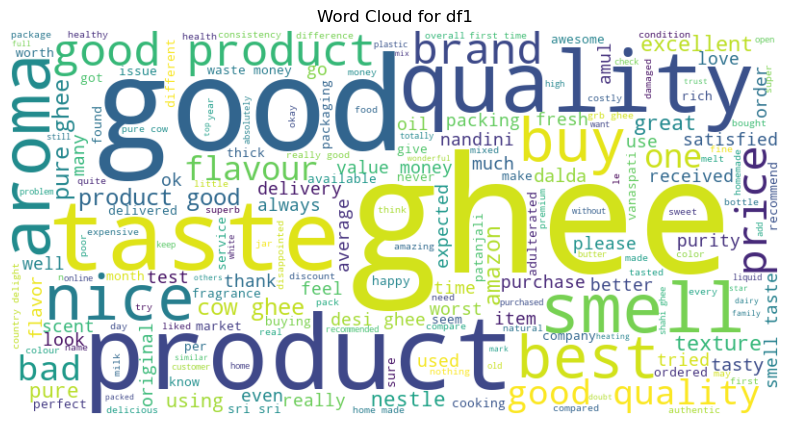

In [19]:
# Visualize word clouds for df1
wordcloud1 = WordCloud(width=800, height=400, background_color='white').generate(text_data1)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud1, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for df1')
plt.show()

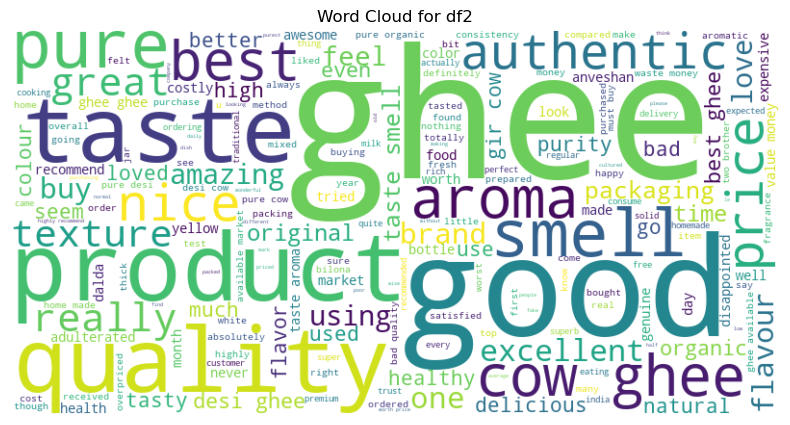

In [20]:
# Visualize word clouds for df2
wordcloud2 = WordCloud(width=800, height=400, background_color='white').generate(text_data2)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for df2')
plt.show()

In [21]:
# Generate bigrams for df1
bigrams1 = ngrams(filtered_words1, 2)
bigram_counts1 = collections.Counter(bigrams1)
top_10_bigrams1 = bigram_counts1.most_common(10)
print("\nTop 10 Bigrams in df1:")
for bigram, count in top_10_bigrams1:
    print(f"{' '.join(bigram)}: {count}")


Top 10 Bigrams in df1:
good product: 68
good quality: 61
product good: 52
pure ghee: 51
cow ghee: 51
ghee good: 40
quality good: 35
good good: 34
good taste: 33
taste like: 33


In [22]:
# Generate bigrams for df2
bigrams2 = ngrams(filtered_words2, 2)
bigram_counts2 = collections.Counter(bigrams2)
top_10_bigrams2 = bigram_counts2.most_common(10)
print("\nTop 10 Bigrams in df2:")
for bigram, count in top_10_bigrams2:
    print(f"{' '.join(bigram)}: {count}")


Top 10 Bigrams in df2:
cow ghee: 75
taste smell: 33
quality ghee: 33
desi ghee: 30
best ghee: 30
pure ghee: 29
ghee good: 28
good taste: 25
good quality: 25
good product: 24


In [23]:
# Generate TF-IDF matrix for df1
vectorizer1 = TfidfVectorizer(stop_words='english')
tfidf_matrix1 = vectorizer1.fit_transform(df1['Comment'])
tfidf_df1 = pd.DataFrame(tfidf_matrix1.toarray(), columns=vectorizer1.get_feature_names_out())
print("\nTF-IDF Matrix for df1:")
print(tfidf_df1.head())


TF-IDF Matrix for df1:
   aashirwaad  aashirwad  able  absolute  absolutely  abt  according  \
0         0.0        0.0   0.0       0.0         0.0  0.0        0.0   
1         0.0        0.0   0.0       0.0         0.0  0.0        0.0   
2         0.0        0.0   0.0       0.0         0.0  0.0        0.0   
3         0.0        0.0   0.0       0.0         0.0  0.0        0.0   
4         0.0        0.0   0.0       0.0         0.0  0.0        0.0   

   accumulates  accurate  acha  ...  written  wrong  wrost  year  yellow  \
0          0.0       0.0   0.0  ...      0.0    0.0    0.0   0.0     0.0   
1          0.0       0.0   0.0  ...      0.0    0.0    0.0   0.0     0.0   
2          0.0       0.0   0.0  ...      0.0    0.0    0.0   0.0     0.0   
3          0.0       0.0   0.0  ...      0.0    0.0    0.0   0.0     0.0   
4          0.0       0.0   0.0  ...      0.0    0.0    0.0   0.0     0.0   

   yellowish  yes   yr  yummy  zero  
0        0.0  0.0  0.0    0.0   0.0  
1        0

In [24]:
# Generate TF-IDF matrix for df2
vectorizer2 = TfidfVectorizer(stop_words='english')
tfidf_matrix2 = vectorizer2.fit_transform(df2['Comment'])
tfidf_df2 = pd.DataFrame(tfidf_matrix2.toarray(), columns=vectorizer2.get_feature_names_out())
print("\nTF-IDF Matrix for df2:")
print(tfidf_df2.head())


TF-IDF Matrix for df2:
   aahaha  able  abroad  absolute  absolutely  accha  according  acidity  \
0     0.0   0.0     0.0       0.0    0.000000    0.0        0.0      0.0   
1     0.0   0.0     0.0       0.0    0.000000    0.0        0.0      0.0   
2     0.0   0.0     0.0       0.0    0.000000    0.0        0.0      0.0   
3     0.0   0.0     0.0       0.0    0.000000    0.0        0.0      0.0   
4     0.0   0.0     0.0       0.0    0.772358    0.0        0.0      0.0   

   actual  actually  ...  wrong  wrongly  year  yellow  yellowness  yes  \
0     0.0       0.0  ...    0.0      0.0   0.0     0.0         0.0  0.0   
1     0.0       0.0  ...    0.0      0.0   0.0     0.0         0.0  0.0   
2     0.0       0.0  ...    0.0      0.0   0.0     0.0         0.0  0.0   
3     0.0       0.0  ...    0.0      0.0   0.0     0.0         0.0  0.0   
4     0.0       0.0  ...    0.0      0.0   0.0     0.0         0.0  0.0   

   youth   yr  yumming  yummy  
0    0.0  0.0      0.0    0.0  
1   

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import pairwise_distances
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [26]:
comments1 = df1['Comment']
comments2 = df2['Comment']
combined_comments = pd.concat([comments1, comments2])

In [27]:
vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(combined_comments)
X1 = vectorizer.transform(comments1)
X2 = vectorizer.transform(comments2)

In [28]:
distances1 = pairwise_distances(X1.toarray(), metric='euclidean')
distances2 = pairwise_distances(X2.toarray(), metric='euclidean')

In [29]:
word_counts1 = X1.toarray().sum(axis=0)
words1 = vectorizer.get_feature_names_out()
top_words1 = pd.DataFrame({'word': words1, 'count': word_counts1})
top_words1 = top_words1.sort_values(by='count', ascending=False).head(10)

word_counts2 = X2.toarray().sum(axis=0)
words2 = vectorizer.get_feature_names_out()
top_words2 = pd.DataFrame({'word': words2, 'count': word_counts2})
top_words2 = top_words2.sort_values(by='count', ascending=False).head(10)

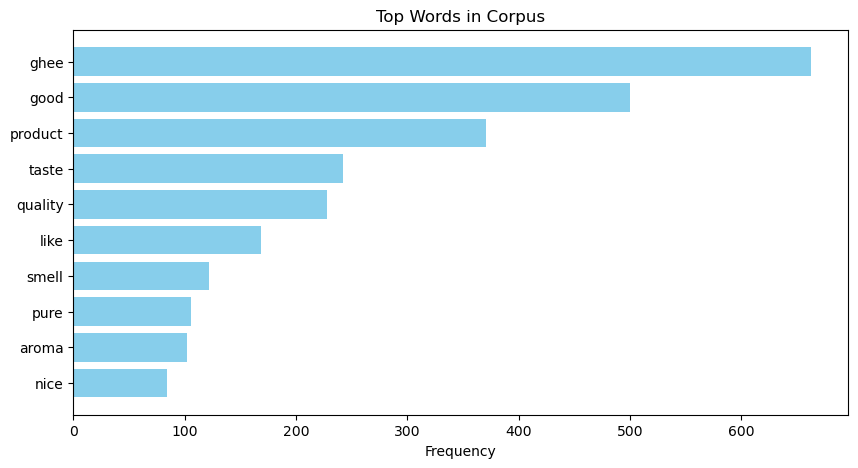

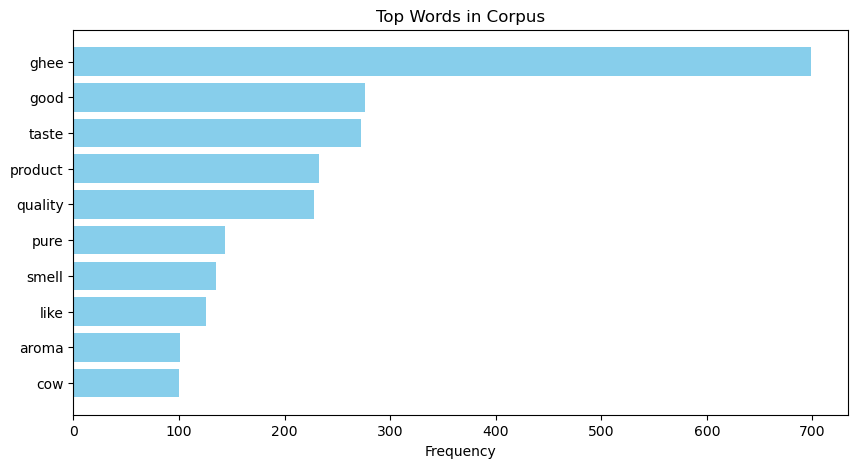

In [30]:
plt.figure(figsize=(10, 5))
plt.barh(top_words1['word'], top_words1['count'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Top Words in Corpus')
plt.gca().invert_yaxis() # Invert y-axis to have the highest frequency on top
plt.show()

plt.figure(figsize=(10, 5))
plt.barh(top_words2['word'], top_words2['count'], color='skyblue')
plt.xlabel('Frequency')
plt.title('Top Words in Corpus')
plt.gca().invert_yaxis() # Invert y-axis to have the highest frequency on top
plt.show()


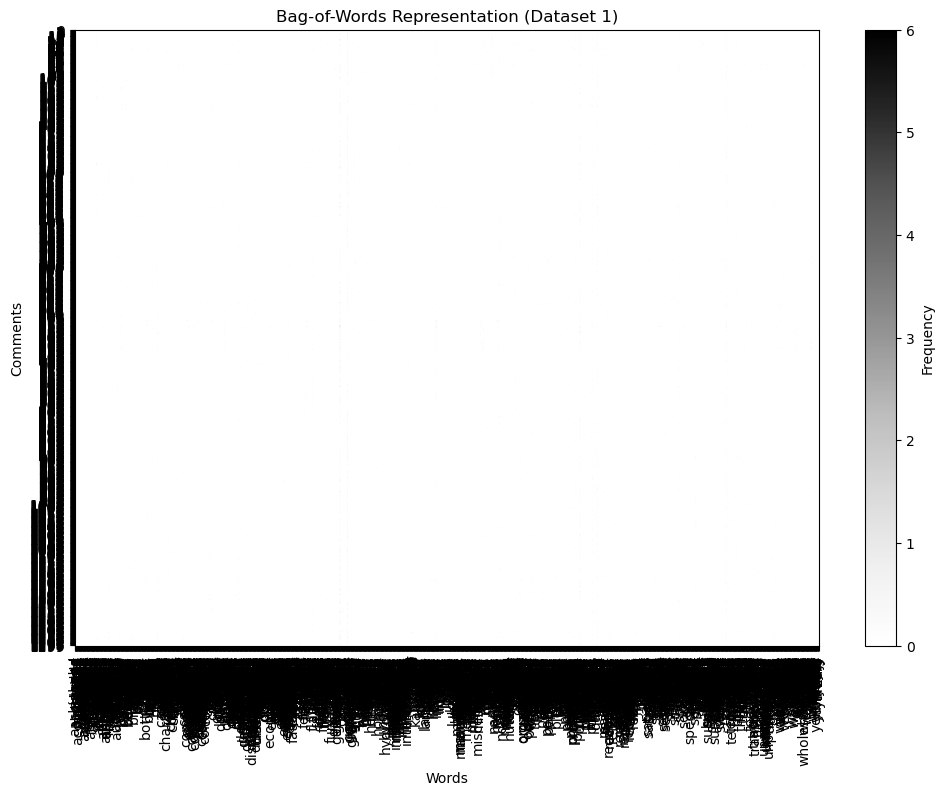

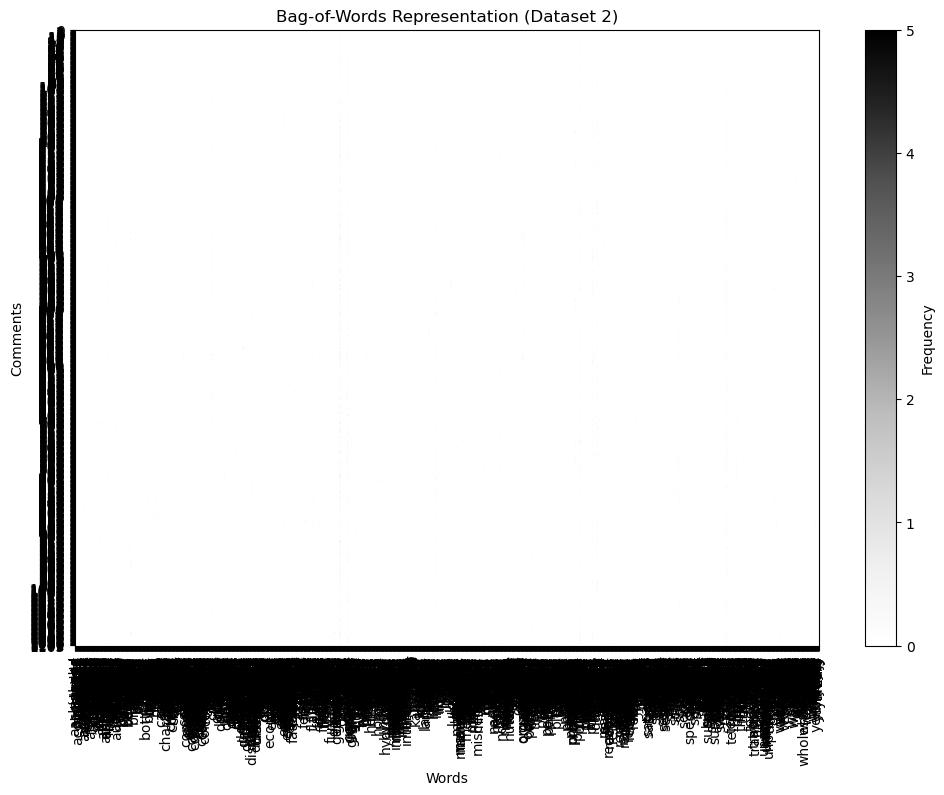

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Bag-of-Words Visualization for Dataset 1 ---
# Convert bag-of-words to DataFrame for better visualization
bag_of_words_df1 = pd.DataFrame(X1.toarray(), columns=vectorizer.get_feature_names_out())

plt.figure(figsize=(12, 8))
plt.imshow(bag_of_words_df1, cmap='Greys', aspect='auto')
plt.colorbar(label='Frequency')
plt.title('Bag-of-Words Representation (Dataset 1)')
plt.xlabel('Words')
plt.ylabel('Comments')
plt.xticks(ticks=np.arange(len(bag_of_words_df1.columns)), labels=bag_of_words_df1.columns, rotation=90)
plt.yticks(ticks=np.arange(len(bag_of_words_df1)), labels=df1.index)
plt.show()

# --- Bag-of-Words Visualization for Dataset 2 ---
# Convert bag-of-words to DataFrame for better visualization
bag_of_words_df2 = pd.DataFrame(X2.toarray(), columns=vectorizer.get_feature_names_out())

plt.figure(figsize=(12, 8))
plt.imshow(bag_of_words_df2, cmap='Greys', aspect='auto')
plt.colorbar(label='Frequency')
plt.title('Bag-of-Words Representation (Dataset 2)')
plt.xlabel('Words')
plt.ylabel('Comments')
plt.xticks(ticks=np.arange(len(bag_of_words_df2.columns)), labels=bag_of_words_df2.columns, rotation=90)
plt.yticks(ticks=np.arange(len(bag_of_words_df2)), labels=df2.index)
plt.show()


In [32]:
# Fit the model
agglo_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
agglo_model.fit(distances1)

# Print the cluster labels (this will be trivial since each point forms its own cluster at distance_threshold=0)
print("Cluster labels:", agglo_model.labels_)

# Print the merging steps (children)
print("Merging steps (children):", agglo_model.children_)

# Number of leaves (individual points)
print("Number of leaves:", agglo_model.n_leaves_)

# Number of connected components
print("Connected components:", agglo_model.n_connected_components_)


D:\Anaconda\Lib\site-packages\scipy\cluster\hierarchy.py:833: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


Cluster labels: [904 903 979 ...   2   1   0]
Merging steps (children): [[   4  970]
 [1005 1046]
 [ 993 1032]
 ...
 [2591 2593]
 [2594 2596]
 [2595 2597]]
Number of leaves: 1300
Connected components: 1


In [33]:
# Fit the model
agglo_model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
agglo_model.fit(distances2)

# Print the cluster labels (this will be trivial since each point forms its own cluster at distance_threshold=0)
print("Cluster labels:", agglo_model.labels_)

# Print the merging steps (children)
print("Merging steps (children):", agglo_model.children_)

# Number of leaves (individual points)
print("Number of leaves:", agglo_model.n_leaves_)

# Number of connected components
print("Connected components:", agglo_model.n_connected_components_)


D:\Anaconda\Lib\site-packages\scipy\cluster\hierarchy.py:833: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


Cluster labels: [750 938 911 ...   3   1   0]
Merging steps (children): [[   3   91]
 [   5  139]
 [  86  516]
 ...
 [2196 2202]
 [2200 2203]
 [2204 2205]]
Number of leaves: 1104
Connected components: 1


C:\Users\LENOVO T 470S\AppData\Local\Temp\ipykernel_5824\3073541788.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix_agglo = linkage(distances1, method='ward')


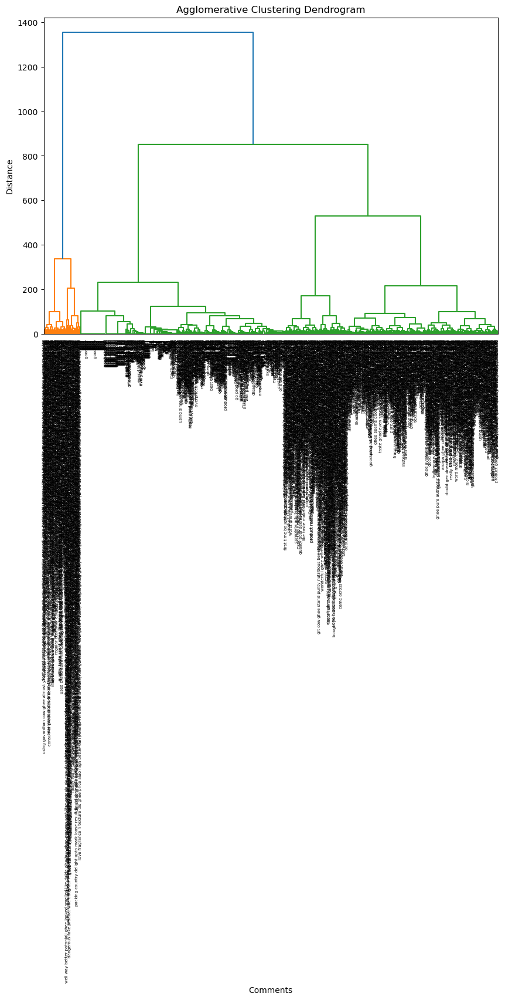

In [34]:
linkage_matrix_agglo = linkage(distances1, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix_agglo, labels=comments1.values, leaf_rotation=90)
plt.title('Agglomerative Clustering Dendrogram')
plt.xlabel('Comments')
plt.ylabel('Distance')
plt.show()


C:\Users\LENOVO T 470S\AppData\Local\Temp\ipykernel_5824\1748334740.py:1: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix_agglo = linkage(distances2, method='ward')


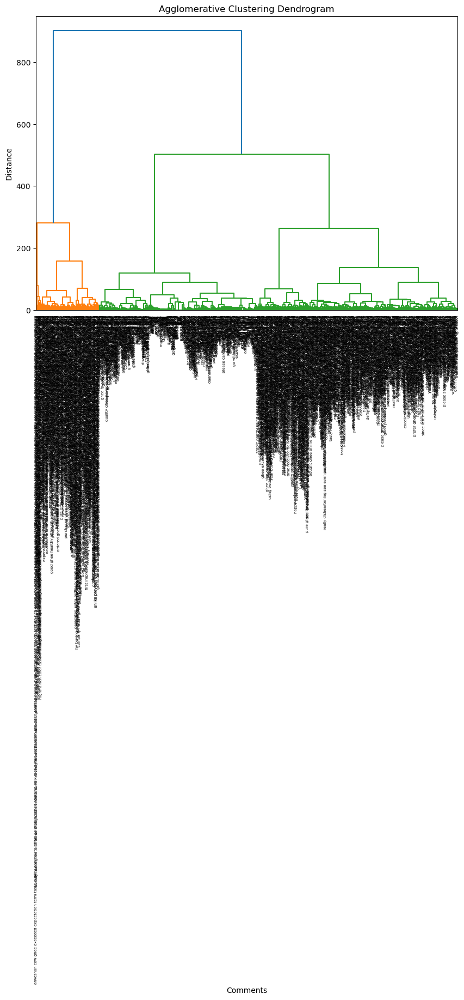

In [35]:
linkage_matrix_agglo = linkage(distances2, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix_agglo, labels=comments2.values, leaf_rotation=90)
plt.title('Agglomerative Clustering Dendrogram')
plt.xlabel('Comments')
plt.ylabel('Distance')
plt.show()


C:\Users\LENOVO T 470S\AppData\Local\Temp\ipykernel_5824\3176101779.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix_hierarchical = linkage(distances1, method='ward')


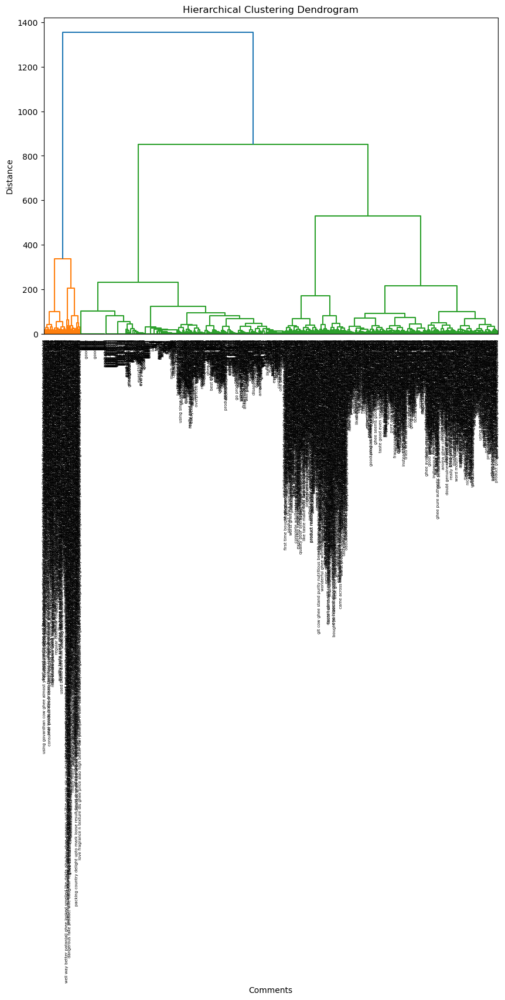

In [36]:
# Step 6: Perform Hierarchical Clustering and plot dendrogram
linkage_matrix_hierarchical = linkage(distances1, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix_hierarchical, labels=comments1.values,leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Comments')
plt.ylabel('Distance')
plt.show()

C:\Users\LENOVO T 470S\AppData\Local\Temp\ipykernel_5824\1168786295.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix_hierarchical = linkage(distances2, method='ward')


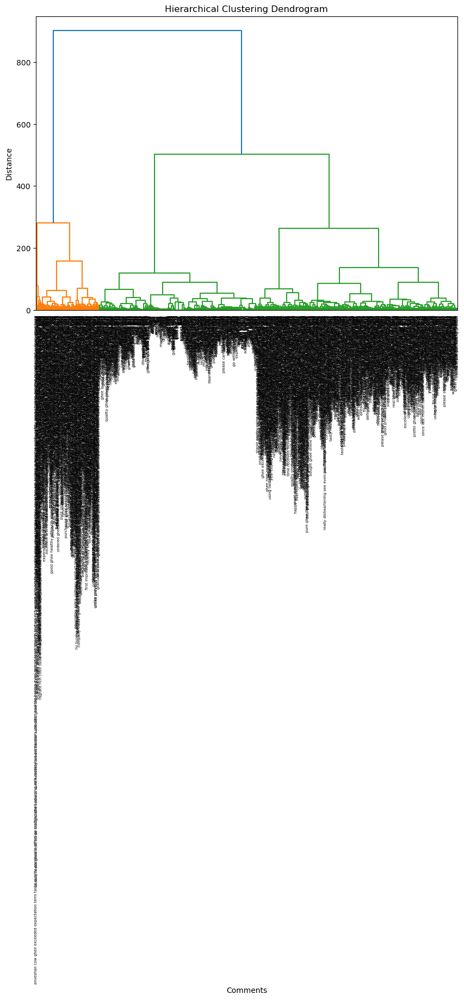

In [37]:
# Step 6: Perform Hierarchical Clustering and plot dendrogram
linkage_matrix_hierarchical = linkage(distances2, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linkage_matrix_hierarchical, labels=comments2.values,leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Comments')
plt.ylabel('Distance')
plt.show()

In [38]:
import plotly.express as px
from sklearn.feature_extraction.text import CountVectorizer

In [41]:
# Function to perform EDA for a given dataset
def perform_eda(df, dataset_name):
    print(f"### EDA for {dataset_name} ###")
    
    # Check for missing values
    print("\nMissing Values:")
    print(df.isnull().sum())

    # Ensure 'Comment' and 'Label' columns exist in the dataframe
    if 'Comment' in df.columns and 'Label' in df.columns:
        # Add comment length and word count
        df['comment_length'] = df['Comment'].apply(len)
        df['word_count'] = df['Comment'].apply(lambda x: len(x.split()))

        # Interactive scatter plot for comment length vs word count
        fig = px.scatter(
            df, x='comment_length', y='word_count',
            color='Label',
            title=f'{dataset_name}: Comment Length vs Word Count',
            labels={'comment_length': 'Comment Length', 'word_count': 'Word Count'},
            hover_data=['Comment']
        )
        fig.show()

        # Interactive histogram for comment lengths
        fig_length = px.histogram(
            df, x='comment_length', nbins=30,
            color='Label',
            title=f'{dataset_name}: Distribution of Comment Lengths',
            labels={'comment_length': 'Comment Length'}
        )
        fig_length.show()

        # Interactive histogram for word counts
        fig_word_count = px.histogram(
            df, x='word_count', nbins=30,
            color='Label',
            title=f'{dataset_name}: Distribution of Word Counts',
            labels={'word_count': 'Word Count'}
        )
        fig_word_count.show()

        # N-gram analysis function
        def get_ngrams(comments, n=2, top_n=20):
            vectorizer = CountVectorizer(ngram_range=(n, n), stop_words='english')
            ngrams = vectorizer.fit_transform(comments)
            ngram_counts = ngrams.sum(axis=0)
            ngram_features = vectorizer.get_feature_names_out()

            # Create a DataFrame of n-grams and their counts
            ngram_df = pd.DataFrame(ngram_counts.A1, index=ngram_features, columns=['count'])
            return ngram_df.sort_values(by='count', ascending=False).head(top_n)

        # Generate and display bigrams
        comments = df['Comment'].dropna()
        bigrams = get_ngrams(comments, n=2, top_n=20)
        print("\nTop 20 Bigrams:")
        print(bigrams)

        # Bar plot for bigrams
        fig_bigrams = px.bar(
            bigrams, x=bigrams.index, y='count',
            title=f'{dataset_name}: Top 20 Bigrams',
            labels={'x': 'Bigrams', 'count': 'Count'}
        )
        fig_bigrams.show()

        # Generate and display trigrams
        trigrams = get_ngrams(comments, n=3, top_n=20)
        print("\nTop 20 Trigrams:")
        print(trigrams)

        # Bar plot for trigrams
        fig_trigrams = px.bar(
            trigrams, x=trigrams.index, y='count',
            title=f'{dataset_name}: Top 20 Trigrams',
            labels={'x': 'Trigrams', 'count': 'Count'}
        )
        fig_trigrams.show()
    else:
        print(f"Required columns 'Comment' or 'Label' are missing in {dataset_name}.")


In [42]:
# Perform EDA for df1
perform_eda(df1, "Dataset 1 (FDS A1)")


### EDA for Dataset 1 (FDS A1) ###

Missing Values:
Category       0
Customer_ID    0
Website        0
Comment        0
Label          0
Date           0
sentiment      0
dtype: int64



Top 20 Bigrams:
              count
good product     61
good quality     58
pure ghee        51
cow ghee         51
taste like       34
ghee good        33
quality ghee     30
value money      30
desi ghee        29
product good     29
good taste       28
quality good     26
taste good       25
ghee smell       24
ghee taste       20
like ghee        20
waste money      19
best ghee        19
smell taste      17
nice product     16



Top 20 Trigrams:
                         count
pure cow ghee               11
like pure ghee              10
good quality ghee            9
taste like ghee              8
ghee good quality            7
pure desi ghee               7
taste like pure              5
country delight ghee         5
ghee smell taste             5
git pure cow                 5
taste like dalda             5
good quality product         4
product pure ghee            4
good product quality         4
ghee cow ghee                4
ghee like butter             4
smell taste like             4
value money product          4
like ghee know               3
received good condition      3


In [43]:
# Perform EDA for df2
perform_eda(df2, "Dataset 2 (FDS A2)")


### EDA for Dataset 2 (FDS A2) ###

Missing Values:
Category       0
Customer_ID    0
Website        0
Comment        0
Label          0
Date           0
sentiment      0
dtype: int64



Top 20 Bigrams:
                 count
cow ghee            75
taste smell         34
quality ghee        31
desi ghee           30
best ghee           29
pure ghee           27
good quality        25
ghee good           22
taste good          22
good taste          22
gir cow             21
good product        20
ghee taste          20
quality product     20
value money         20
smell taste         19
taste aroma         18
taste like          17
product good        16
pure organic        15



Top 20 Trigrams:
                       count
gir cow ghee              16
pure cow ghee             12
desi cow ghee             11
pure organic ghee          8
ghee available market      8
pure desi ghee             7
good quality ghee          5
desi gir cow               5
like pure ghee             5
smell taste like           5
ghee taste smell           5
buy want pure              4
using ghee month           4
like home ghee             4
pure desi cow              4
taste smell ghee           4
taste like home            4
ghee best quality          4
pure taste good            4
cow cultured ghee          4


## PART 3

In [44]:
from scipy import stats
import numpy as np
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}
df1['sentiment_column'] = df1['sentiment'].map(sentiment_mapping)

sentiment_scores = df1['sentiment_column'].values
# Replace 'sentiment_column' with your actual column name
# Define your benchmark value
benchmark_value = 0.0 # Example benchmark, use this
# Perform the one-sample t-test
mean_score = np.mean(sentiment_scores)
std_dev = np.std(sentiment_scores, ddof=1) # Sample standard deviation
n = len(sentiment_scores)

print(mean_score)
print(std_dev)
print(n)

0.6107692307692307
0.6969907994888856
1300


In [45]:
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}
df2['sentiment_column'] = df2['sentiment'].map(sentiment_mapping)

sentiment_scores2 = df2['sentiment_column'].values
# Replace 'sentiment_column' with your actual column name
# Define your benchmark value
benchmark_value2 = 0.0 # Example benchmark, use this
# Perform the one-sample t-test
mean_score2 = np.mean(sentiment_scores2)
std_dev2 = np.std(sentiment_scores2, ddof=1) # Sample standard deviation
n2 = len(sentiment_scores2)

print(mean_score2)
print(std_dev2)
print(n2)

0.595108695652174
0.6826522770929848
1104


In [46]:
from scipy.stats import levene

# Assuming df1 and df2 have already been processed and contain the 'sentiment' column
# Map sentiment labels to numeric values if not already done
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}

# Convert sentiment labels to numeric values
df1['sentiment_numeric'] = df1['sentiment'].map(sentiment_mapping)
df2['sentiment_numeric'] = df2['sentiment'].map(sentiment_mapping)

# Group sentiments by database
grouped_sentiments = [df1['sentiment_numeric'], df2['sentiment_numeric']]

# Levene's Test for equal variances
stat, p_value = levene(*grouped_sentiments)
print(f"Levene's Test Statistic: {stat:.4f}, P-Value: {p_value:.4f}")

# Interpret the p-value
if p_value > 0.05:
    print("Variances are equal (Fail to reject H0).")
else:
    print("Variances are not equal (Reject H0).")


Levene's Test Statistic: 0.3071, P-Value: 0.5795
Variances are equal (Fail to reject H0).


In [47]:
from scipy.stats import shapiro, levene, f_oneway, kruskal

# Group sentiments in df1
grouped_sentiments_df1 = [group['sentiment_column'] for name, group in df1.groupby('Website')]

# Check normality using Shapiro-Wilk Test for df1
shapiro_stat_df1, shapiro_p_value_df1 = shapiro(df1['sentiment_column'])
print(f"Shapiro-Wilk Test Statistic for df1: {shapiro_stat_df1:.4f}, P-Value: {shapiro_p_value_df1:.4f}")

# Check for equal variances using Levene's Test for df1
levene_stat_df1, levene_p_value_df1 = levene(*grouped_sentiments_df1)
print(f"Levene's Test Statistic for df1: {levene_stat_df1:.4f}, P-Value: {levene_p_value_df1:.4f}")

# Perform ANOVA or Kruskal-Wallis H Test for df1
if levene_p_value_df1 > 0.05 and shapiro_p_value_df1 > 0.05:
    # Perform ANOVA
    f_statistic_df1, anova_p_value_df1 = f_oneway(*grouped_sentiments_df1)
    print(f"ANOVA F-Statistic for df1: {f_statistic_df1:.4f}, P-Value: {anova_p_value_df1:.4f}")
    if anova_p_value_df1 < 0.05:
        print("Reject the null hypothesis for df1: There is a significant difference between the groups.")
    else:
        print("Fail to reject the null hypothesis for df1: No significant difference between the groups.")
else:
    # Perform Kruskal-Wallis H Test
    h_statistic_df1, kruskal_p_value_df1 = kruskal(*grouped_sentiments_df1)
    print(f"Kruskal-Wallis H Statistic for df1: {h_statistic_df1:.4f}, P-Value: {kruskal_p_value_df1:.4f}")
    if kruskal_p_value_df1 < 0.05:
        print("Reject the null hypothesis for df1: There is a significant difference between the groups.")
    else:
        print("Fail to reject the null hypothesis for df1: No significant difference between the groups.")


Shapiro-Wilk Test Statistic for df1: 0.5836, P-Value: 0.0000
Levene's Test Statistic for df1: 10.9352, P-Value: 0.0000
Kruskal-Wallis H Statistic for df1: 24.4051, P-Value: 0.0000
Reject the null hypothesis for df1: There is a significant difference between the groups.


In [48]:
# Group sentiments in df2
grouped_sentiments_df2 = [group['sentiment_column'] for name, group in df2.groupby('Website')]

# Check normality using Shapiro-Wilk Test for df2
shapiro_stat_df2, shapiro_p_value_df2 = shapiro(df2['sentiment_column'])
print(f"Shapiro-Wilk Test Statistic for df2: {shapiro_stat_df2:.4f}, P-Value: {shapiro_p_value_df2:.4f}")

# Check for equal variances using Levene's Test for df2
levene_stat_df2, levene_p_value_df2 = levene(*grouped_sentiments_df2)
print(f"Levene's Test Statistic for df2: {levene_stat_df2:.4f}, P-Value: {levene_p_value_df2:.4f}")

# Perform ANOVA or Kruskal-Wallis H Test for df2
if levene_p_value_df2 > 0.05 and shapiro_p_value_df2 > 0.05:
    # Perform ANOVA
    f_statistic_df2, anova_p_value_df2 = f_oneway(*grouped_sentiments_df2)
    print(f"ANOVA F-Statistic for df2: {f_statistic_df2:.4f}, P-Value: {anova_p_value_df2:.4f}")
    if anova_p_value_df2 < 0.05:
        print("Reject the null hypothesis for df2: There is a significant difference between the groups.")
    else:
        print("Fail to reject the null hypothesis for df2: No significant difference between the groups.")
else:
    # Perform Kruskal-Wallis H Test
    h_statistic_df2, kruskal_p_value_df2 = kruskal(*grouped_sentiments_df2)
    print(f"Kruskal-Wallis H Statistic for df2: {h_statistic_df2:.4f}, P-Value: {kruskal_p_value_df2:.4f}")
    if kruskal_p_value_df2 < 0.05:
        print("Reject the null hypothesis for df2: There is a significant difference between the groups.")
    else:
        print("Fail to reject the null hypothesis for df2: No significant difference between the groups.")


Shapiro-Wilk Test Statistic for df2: 0.6137, P-Value: 0.0000
Levene's Test Statistic for df2: 7.9587, P-Value: 0.0000
Kruskal-Wallis H Statistic for df2: 48.2854, P-Value: 0.0000
Reject the null hypothesis for df2: There is a significant difference between the groups.


Pearson Correlation between Sentiment and Comment Length: -0.0648, P-Value: 0.0195
Spearman Correlation between Sentiment and Comment Length: -0.0503, P-Value: 0.0696


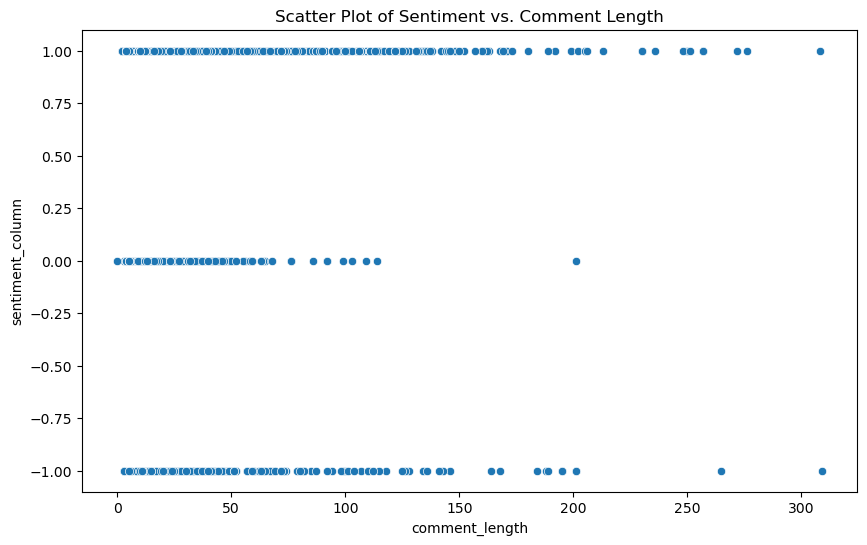

D:\Anaconda\Lib\site-packages\scipy\stats\_stats_py.py:4781: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

D:\Anaconda\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



Pearson Correlation between Sentiment and Hour of Day:nan, P-Value: nan
Spearman Correlation between Sentiment and Hour of Day:nan, P-Value: nan


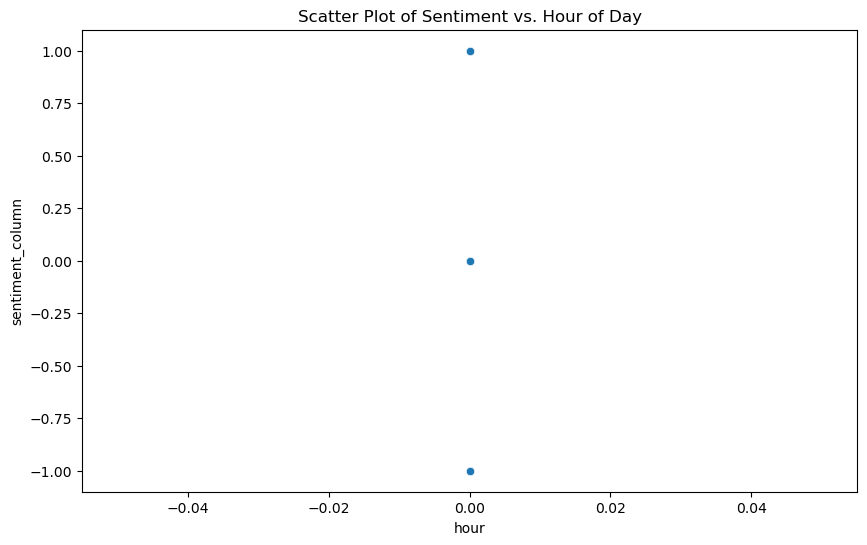

Pearson Correlation between Sentiment and Hour of Day:0.1068, P-Value: 0.0001
Spearman Correlation between Sentiment and Hour of Day:0.1047, P-Value: 0.0002


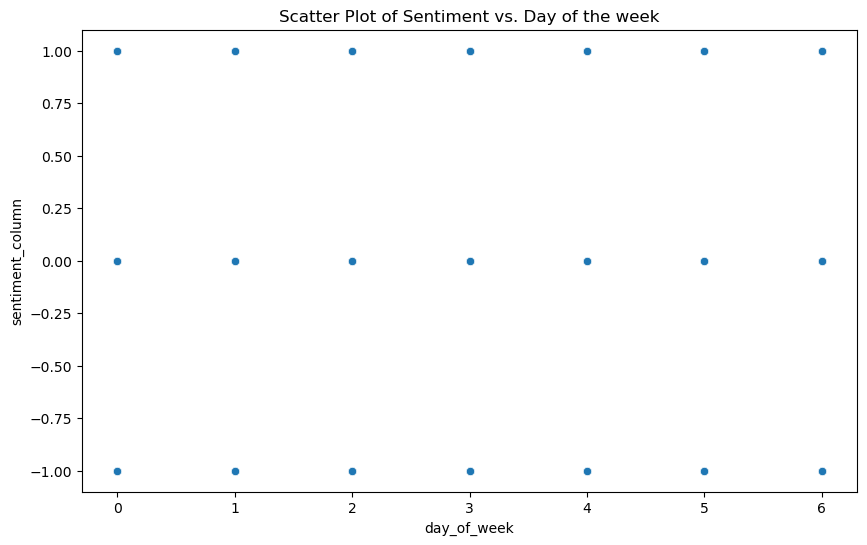

In [49]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
# Create additional variables if needed
# For example, calculate the comment length if it's not already in your data
df1['comment_length'] = df1['Comment'].apply(len)
# If you have a timestamp or timing information, ensure it's in a datetime format
df1['Date'] = pd.to_datetime(df1['Date'], format='%d.%m.%Y')
# Checking correlations between sentiment and comment length
pearson_corr, pearson_p_value = pearsonr(df1['sentiment_column'], df1['comment_length'])
spearman_corr, spearman_p_value = spearmanr(df1['sentiment_column'], df1['comment_length'])
print(f"Pearson Correlation between Sentiment and Comment Length: {pearson_corr:.4f}, P-Value: {pearson_p_value:.4f}")
print(f"Spearman Correlation between Sentiment and Comment Length: {spearman_corr:.4f}, P-Value: {spearman_p_value:.4f}")
# Visualizing the correlation with a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df1)
plt.title('Scatter Plot of Sentiment vs. Comment Length')
plt.show()

df1['hour'] = df1['Date'].dt.hour
df1['day_of_week'] = df1['Date'].dt.dayofweek
pearson_corr_time, pearson_p_value_time = pearsonr(df1['sentiment_column'], df1['hour'])
spearman_corr_time, spearman_p_value_time = spearmanr(df1['sentiment_column'], df1['hour'])
print(f"Pearson Correlation between Sentiment and Hour of Day:{pearson_corr_time:.4f}, P-Value: {pearson_p_value_time:.4f}")
print(f"Spearman Correlation between Sentiment and Hour of Day:{spearman_corr_time:.4f}, P-Value: {spearman_p_value_time:.4f}")
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hour', y='sentiment_column', data=df1)
plt.title('Scatter Plot of Sentiment vs. Hour of Day')
plt.show()

pearson_corr_time, pearson_p_value_time = pearsonr(df1['sentiment_column'], df1['day_of_week'])
spearman_corr_time, spearman_p_value_time = spearmanr(df1['sentiment_column'], df1['day_of_week'])
print(f"Pearson Correlation between Sentiment and Hour of Day:{pearson_corr_time:.4f}, P-Value: {pearson_p_value_time:.4f}")
print(f"Spearman Correlation between Sentiment and Hour of Day:{spearman_corr_time:.4f}, P-Value: {spearman_p_value_time:.4f}")
plt.figure(figsize=(10, 6))
sns.scatterplot(x='day_of_week', y='sentiment_column', data=df1)
plt.title('Scatter Plot of Sentiment vs. Day of the week')
plt.show()

Pearson Correlation between Sentiment and Comment Length: 0.1394, P-Value: 0.0000
Spearman Correlation between Sentiment and Comment Length: 0.1852, P-Value: 0.0000


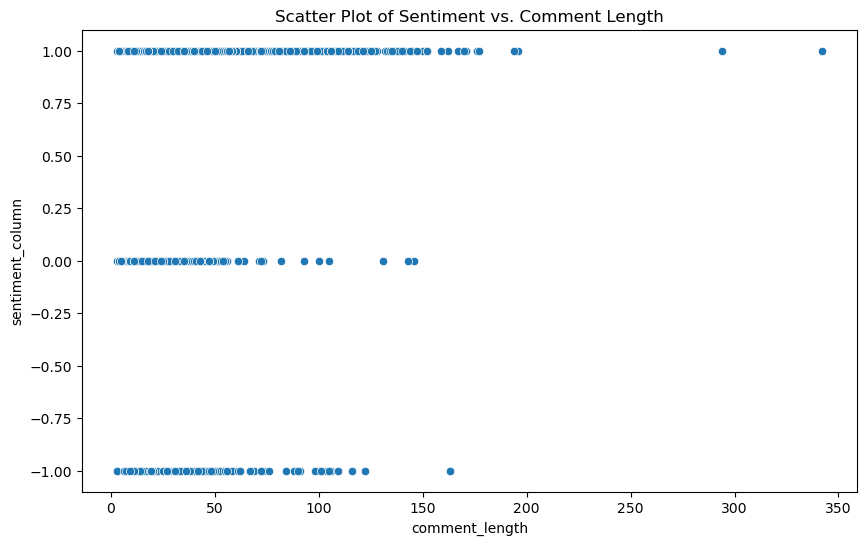

D:\Anaconda\Lib\site-packages\scipy\stats\_stats_py.py:4781: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.

D:\Anaconda\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.



Pearson Correlation between Sentiment and Hour of Day:nan, P-Value: nan
Spearman Correlation between Sentiment and Hour of Day:nan, P-Value: nan


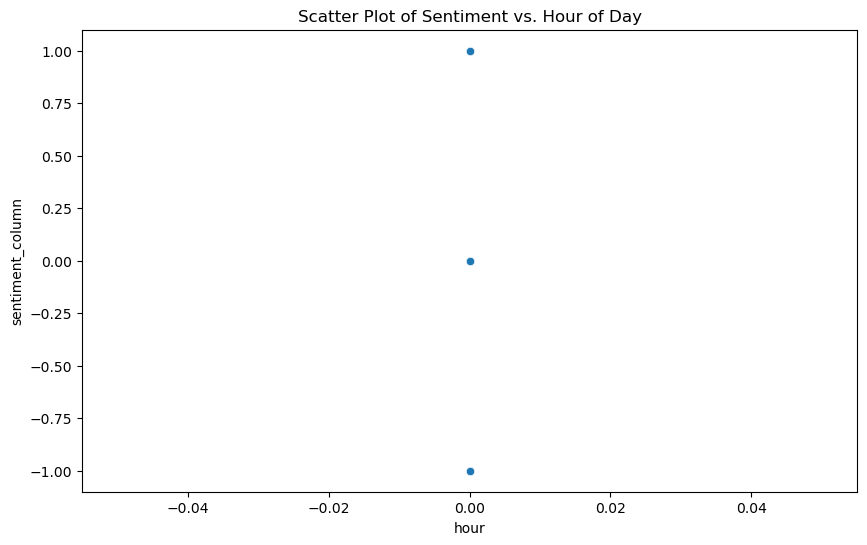

Pearson Correlation between Sentiment and Hour of Day:-0.0016, P-Value: 0.9569
Spearman Correlation between Sentiment and Hour of Day:-0.0009, P-Value: 0.9767


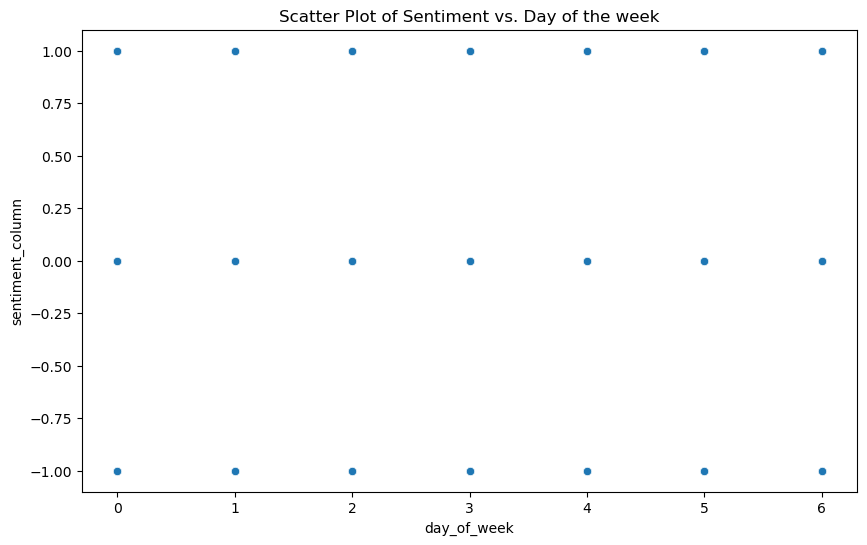

In [50]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
# Create additional variables if needed
# For example, calculate the comment length if it's not already in your data
df2['comment_length'] = df2['Comment'].apply(len)
# If you have a timestamp or timing information, ensure it's in a datetime format
df2['Date'] = pd.to_datetime(df2['Date'], format='%d.%m.%Y')
# Checking correlations between sentiment and comment length
pearson_corr, pearson_p_value = pearsonr(df2['sentiment_column'], df2['comment_length'])
spearman_corr, spearman_p_value = spearmanr(df2['sentiment_column'], df2['comment_length'])
print(f"Pearson Correlation between Sentiment and Comment Length: {pearson_corr:.4f}, P-Value: {pearson_p_value:.4f}")
print(f"Spearman Correlation between Sentiment and Comment Length: {spearman_corr:.4f}, P-Value: {spearman_p_value:.4f}")
# Visualizing the correlation with a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df2)
plt.title('Scatter Plot of Sentiment vs. Comment Length')
plt.show()

df2['hour'] = df2['Date'].dt.hour
df2['day_of_week'] = df2['Date'].dt.dayofweek
pearson_corr_time, pearson_p_value_time = pearsonr(df2['sentiment_column'], df2['hour'])
spearman_corr_time, spearman_p_value_time = spearmanr(df2['sentiment_column'], df2['hour'])
print(f"Pearson Correlation between Sentiment and Hour of Day:{pearson_corr_time:.4f}, P-Value: {pearson_p_value_time:.4f}")
print(f"Spearman Correlation between Sentiment and Hour of Day:{spearman_corr_time:.4f}, P-Value: {spearman_p_value_time:.4f}")
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hour', y='sentiment_column', data=df2)
plt.title('Scatter Plot of Sentiment vs. Hour of Day')
plt.show()

pearson_corr_time, pearson_p_value_time = pearsonr(df2['sentiment_column'], df2['day_of_week'])
spearman_corr_time, spearman_p_value_time = spearmanr(df2['sentiment_column'], df2['day_of_week'])
print(f"Pearson Correlation between Sentiment and Hour of Day:{pearson_corr_time:.4f}, P-Value: {pearson_p_value_time:.4f}")
print(f"Spearman Correlation between Sentiment and Hour of Day:{spearman_corr_time:.4f}, P-Value: {spearman_p_value_time:.4f}")
plt.figure(figsize=(10, 6))
sns.scatterplot(x='day_of_week', y='sentiment_column', data=df2)
plt.title('Scatter Plot of Sentiment vs. Day of the week')
plt.show()

In [51]:
pearson_corr, pearson_p = stats.pearsonr(df1['comment_length'], df1['sentiment_column'])
# Calculate Spearman's rank correlation coefficient and p-value
spearman_corr, spearman_p = stats.spearmanr(df1['comment_length'], df1['sentiment_column'])
# Print results
print(f'Pearson Correlation Coefficient: {pearson_corr:.4f}')
print(f'Pearson p-value: {pearson_p:.4f}')
print(f'Spearman Correlation Coefficient: {spearman_corr:.4f}')
print(f'Spearman p-value: {spearman_p:.4f}')

Pearson Correlation Coefficient: -0.0648
Pearson p-value: 0.0195
Spearman Correlation Coefficient: -0.0503
Spearman p-value: 0.0696


In [52]:
pearson_corr, pearson_p = stats.pearsonr(df2['comment_length'], df2['sentiment_column'])
# Calculate Spearman's rank correlation coefficient and p-value
spearman_corr, spearman_p = stats.spearmanr(df2['comment_length'], df2['sentiment_column'])
# Print results
print(f'Pearson Correlation Coefficient: {pearson_corr:.4f}')
print(f'Pearson p-value: {pearson_p:.4f}')
print(f'Spearman Correlation Coefficient: {spearman_corr:.4f}')
print(f'Spearman p-value: {spearman_p:.4f}')

Pearson Correlation Coefficient: 0.1394
Pearson p-value: 0.0000
Spearman Correlation Coefficient: 0.1852
Spearman p-value: 0.0000


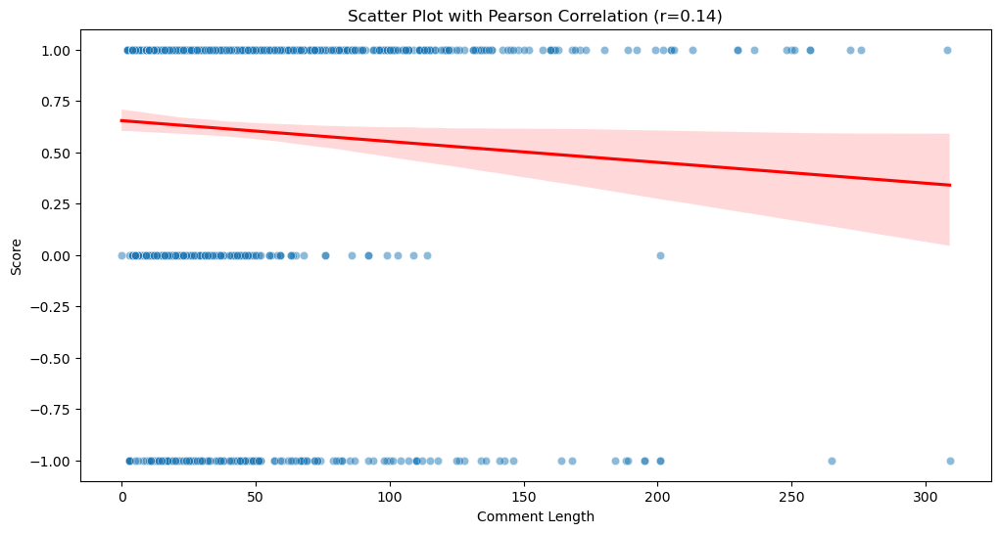

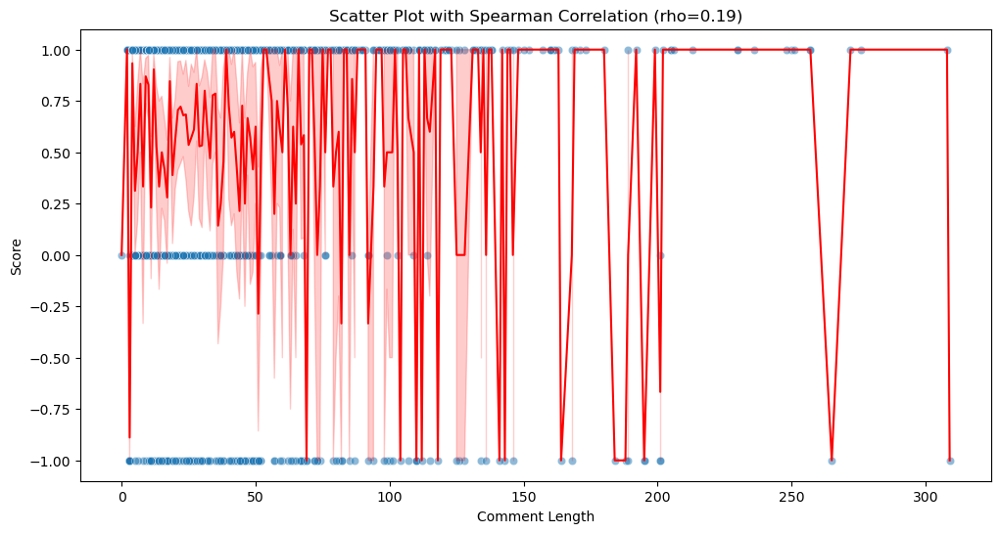

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
# Scatter plot with Pearson correlation line
plt.figure(figsize=(12, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df1, alpha=0.5)
sns.regplot(x='comment_length', y='sentiment_column', data=df1, scatter=False, color='r')
plt.title(f'Scatter Plot with Pearson Correlation (r={pearson_corr:.2f})')
plt.xlabel('Comment Length')
plt.ylabel('Score')
plt.show()
# Scatter plot with Spearman correlation line (non-parametric)
plt.figure(figsize=(12, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df1, alpha=0.5)
sns.lineplot(x='comment_length', y='sentiment_column',
data=df1.sort_values(by='comment_length'), color='r')
plt.title(f'Scatter Plot with Spearman Correlation (rho={spearman_corr:.2f})')
plt.xlabel('Comment Length')
plt.ylabel('Score')
plt.show()

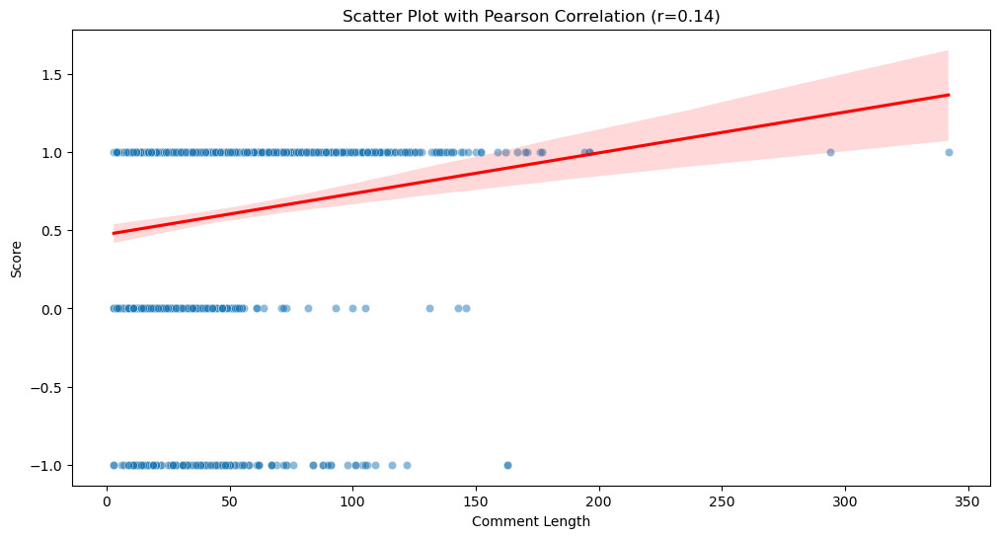

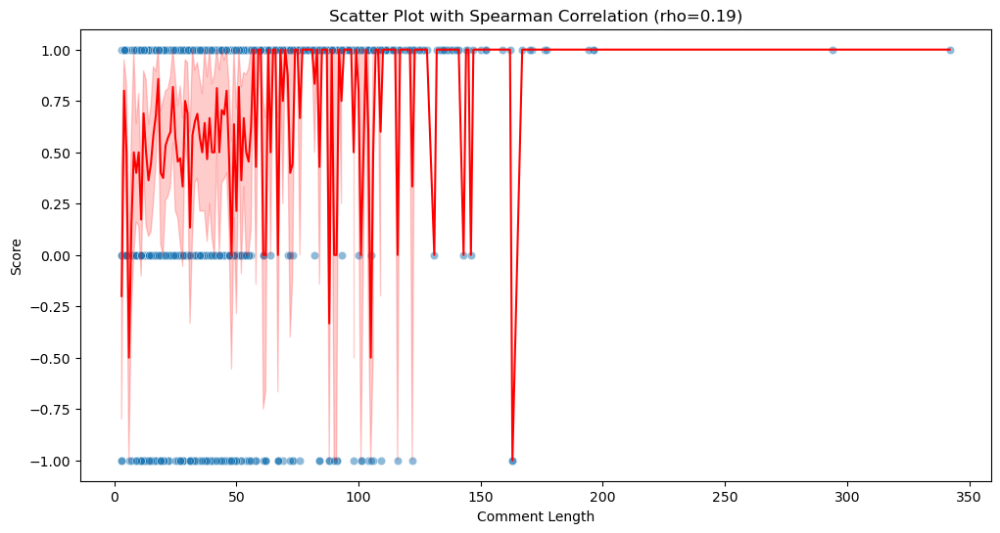

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
# Scatter plot with Pearson correlation line
plt.figure(figsize=(12, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df2, alpha=0.5)
sns.regplot(x='comment_length', y='sentiment_column', data=df2, scatter=False, color='r')
plt.title(f'Scatter Plot with Pearson Correlation (r={pearson_corr:.2f})')
plt.xlabel('Comment Length')
plt.ylabel('Score')
plt.show()
# Scatter plot with Spearman correlation line (non-parametric)
plt.figure(figsize=(12, 6))
sns.scatterplot(x='comment_length', y='sentiment_column', data=df2, alpha=0.5)
sns.lineplot(x='comment_length', y='sentiment_column',
data=df2.sort_values(by='comment_length'), color='r')
plt.title(f'Scatter Plot with Spearman Correlation (rho={spearman_corr:.2f})')
plt.xlabel('Comment Length')
plt.ylabel('Score')
plt.show()

## Part 4

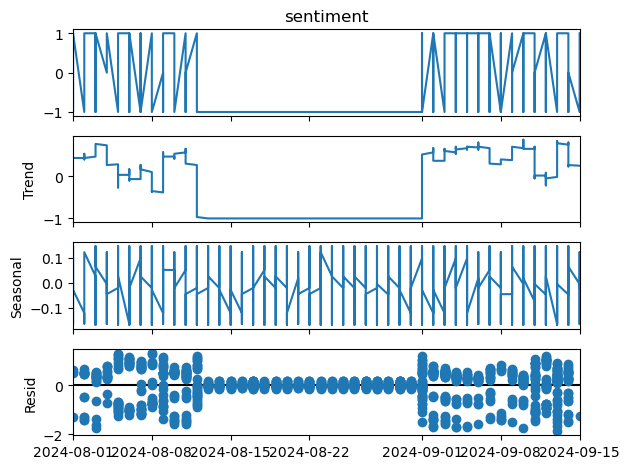

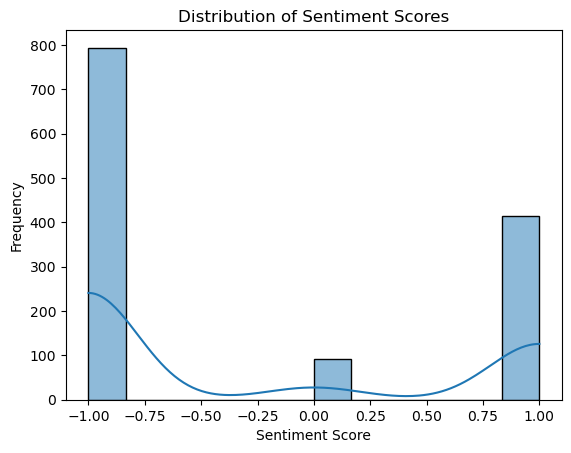

In [55]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split 
from sklearn.ensemble import RandomForestRegressor 
from sklearn.metrics import mean_squared_error 
from sklearn.decomposition import LatentDirichletAllocation 
from sklearn.feature_extraction.text import CountVectorizer 
from statsmodels.tsa.seasonal import seasonal_decompose 
from wordcloud import WordCloud 

# Load your CSV file
df1 = pd.read_csv(r"C:\Users\LENOVO T 470S\Downloads\FDS(A1).csv", encoding='latin1') 

# Basic Preprocessing
sentiment_mapping = {
    'Positive': 1,
    'Negative': -1,
    'Neutral': 0
}

# Add 'sentiment' column based on 'Label'
df1['sentiment'] = df1['Label'].map(sentiment_mapping)

# Ensure that 'Date' is in datetime format
df1['Date'] = pd.to_datetime(df1['Date'], format='%d.%m.%Y')

# Create additional features (e.g., comment length)
df1['comment_length'] = df1['Comment'].apply(len)

# --- Time Series Analysis --- 
# If you have timestamp data, you can decompose the sentiment time series
if 'Date' in df1.columns: 
    df1.set_index('Date', inplace=True)
    
    # Handle missing values (forward fill or drop missing)
    df1['sentiment'].fillna(method='ffill', inplace=True)  # Forward fill
    
    # Decompose the time series (adjust 'period' as needed based on your data)
    try:
        result = seasonal_decompose(df1['sentiment'], model='additive', period=30)  
        result.plot()
        plt.show()
    except ValueError as e:
        print(f"Decomposition error: {e}. Check your 'period' value or data integrity.")

# --- Sentiment Distribution Analysis ---
sns.histplot(df1['sentiment'], kde=True)
plt.title("Distribution of Sentiment Scores")
plt.xlabel("Sentiment Score")
plt.ylabel("Frequency")
plt.show()


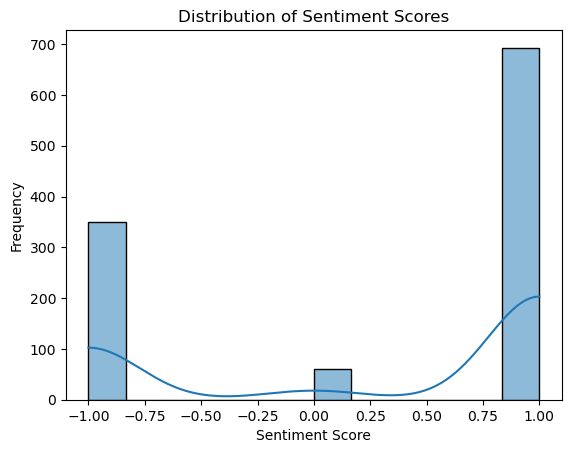

In [56]:
df2 = pd.read_csv(r"C:\Users\LENOVO T 470S\Downloads\FDS(A2).csv", encoding='latin1') 

# Basic Preprocessing
sentiment_mapping = {
    'Positive': 1,
    'Negative': -1,
    'Neutral': 0
}

# Add 'sentiment' column based on 'Label'
df2['sentiment'] = df2['Label'].map(sentiment_mapping)

# Ensure that 'Date' is in datetime format
df2['Date'] = pd.to_datetime(df2['Date'], format='%d.%m.%Y')

# Create additional features (e.g., comment length)
df2['comment_length'] = df2['Comment'].apply(len)

# --- Time Series Analysis --- 
# If you have timestamp data, you can decompose the sentiment time series
if 'Date' in df1.columns: 
    df2.set_index('Date', inplace=True)
    
    # Handle missing values (forward fill or drop missing)
    df2['sentiment'].fillna(method='ffill', inplace=True)  # Forward fill
    
    # Decompose the time series (adjust 'period' as needed based on your data)
    try:
        result = seasonal_decompose(df1['sentiment'], model='additive', period=30)  
        result.plot()
        plt.show()
    except ValueError as e:
        print(f"Decomposition error: {e}. Check your 'period' value or data integrity.")

# --- Sentiment Distribution Analysis ---
sns.histplot(df2['sentiment'], kde=True)
plt.title("Distribution of Sentiment Scores")
plt.xlabel("Sentiment Score")
plt.ylabel("Frequency")
plt.show()


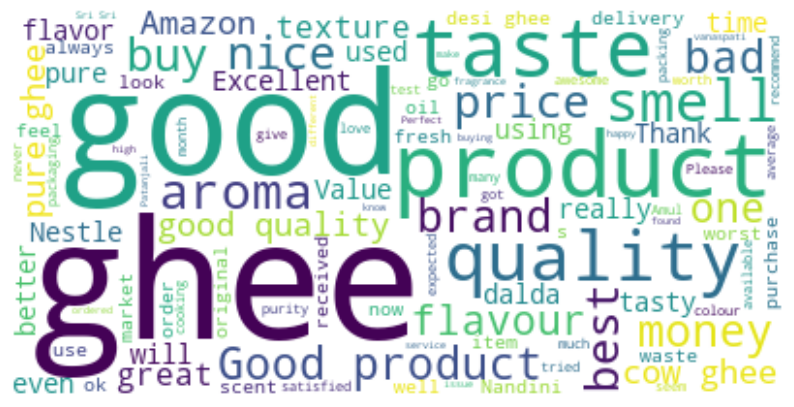

In [57]:
# --- Word Cloud for Comment Analysis --- 
text = " ".join(comment for comment in df1['Comment']) 
wordcloud = WordCloud(max_words=100, background_color="white").generate(text) 
plt.figure(figsize=(10, 6)) 
plt.imshow(wordcloud, interpolation='bilinear') 
plt.axis("off") 
plt.show()

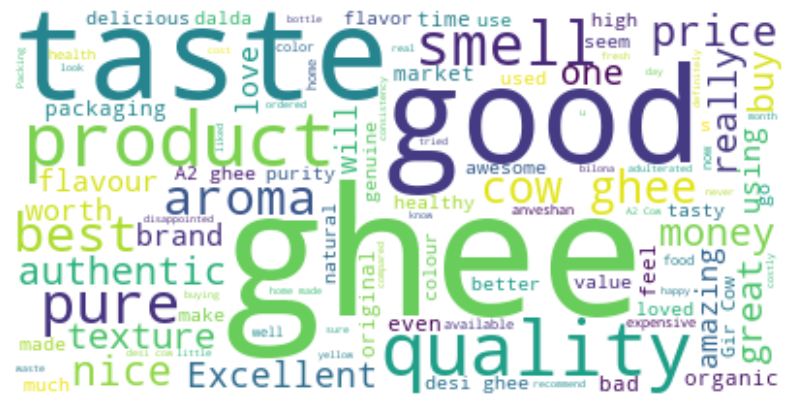

In [58]:
# --- Word Cloud for Comment Analysis --- 
text = " ".join(comment for comment in df2['Comment']) 
wordcloud = WordCloud(max_words=100, background_color="white").generate(text) 
plt.figure(figsize=(10, 6)) 
plt.imshow(wordcloud, interpolation='bilinear') 
plt.axis("off") 
plt.show()

Linear Regression - Mean Squared Error: 0.8202
Decision Tree - Mean Squared Error: 0.9660
Support Vector Machine - Mean Squared Error: 1.1508
Random Forest - Mean Squared Error: 0.9394
XGBoost - Mean Squared Error: 1.0021


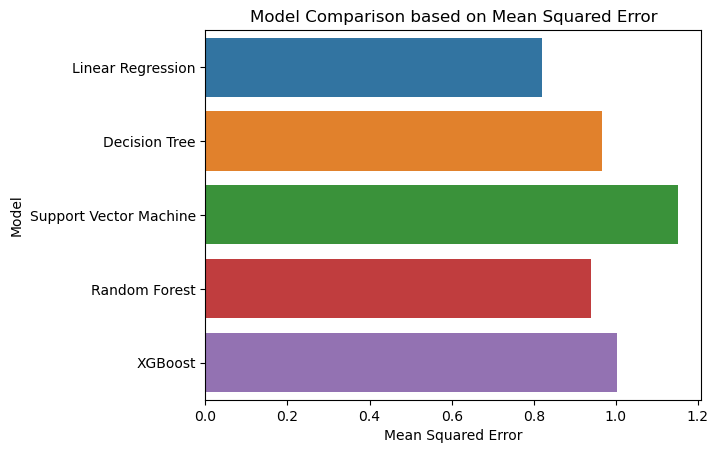

In [59]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_squared_error 
from sklearn.linear_model import LinearRegression 
from sklearn.tree import DecisionTreeRegressor 
from sklearn.svm import SVR 
from sklearn.ensemble import RandomForestRegressor 
import xgboost as xgb 
# Load your CSV file 
# Select features and target 
X = df1[['comment_length']]  # Add other relevant features if available 
y = df1['sentiment'] 
# Split the data into training and test sets 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) 
# Initialize models 
models = { 
    'Linear Regression': LinearRegression(), 
    'Decision Tree': DecisionTreeRegressor(random_state=42), 
    'Support Vector Machine': SVR(), 
    'Random Forest': RandomForestRegressor(random_state=42), 
    'XGBoost': xgb.XGBRegressor(objective='reg:squarederror',random_state=42) 
} 
# Train, predict, and evaluate each model 
results = {} 
for name, model in models.items(): 
    model.fit(X_train, y_train) 
    y_pred = model.predict(X_test) 
    mse = mean_squared_error(y_test, y_pred) 
    results[name] = mse 
    print(f'{name} - Mean Squared Error: {mse:.4f}') 
# Compare the results 
results_df = pd.DataFrame(list(results.items()), columns=['Model', 'Mean Squared Error']) 
sns.barplot(x='Mean Squared Error', y='Model', data=results_df) 
plt.title("Model Comparison based on Mean Squared Error") 
plt.show() 

Linear Regression - Mean Squared Error: 0.8318, Root Mean Squared Error: 0.9120
Decision Tree - Mean Squared Error: 1.1303, Root Mean Squared Error: 1.0632
Support Vector Machine - Mean Squared Error: 1.1123, Root Mean Squared Error: 1.0547
Random Forest - Mean Squared Error: 1.0688, Root Mean Squared Error: 1.0338
XGBoost - Mean Squared Error: 1.0479, Root Mean Squared Error: 1.0237


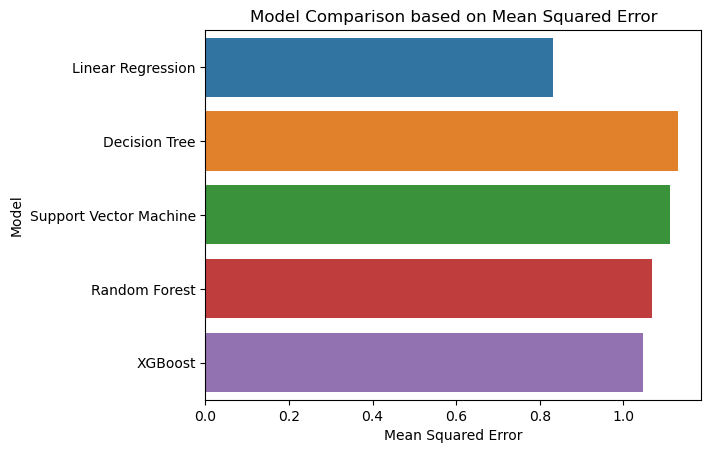

In [60]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split, learning_curve, cross_val_score 
from sklearn.metrics import mean_squared_error 
from sklearn.linear_model import LinearRegression 
from sklearn.tree import DecisionTreeRegressor 
from sklearn.svm import SVR 
from sklearn.ensemble import RandomForestRegressor 
import xgboost as xgb 

# Assuming df2 is already loaded

# Select features and target 
X2 = df2[['comment_length']]  # Add other relevant features if available 
y2 = df2['sentiment'] 

# Split the data into training and test sets 
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42) 

# Initialize models 
models2 = { 
    'Linear Regression': LinearRegression(), 
    'Decision Tree': DecisionTreeRegressor(random_state=42), 
    'Support Vector Machine': SVR(), 
    'Random Forest': RandomForestRegressor(random_state=42), 
    'XGBoost': xgb.XGBRegressor(objective='reg:squarederror', random_state=42) 
} 

# Train, predict, and evaluate each model 
results2 = {} 
for name2, model2 in models2.items(): 
    model2.fit(X_train2, y_train2) 
    y_pred2 = model2.predict(X_test2) 
    mse2 = mean_squared_error(y_test2, y_pred2) 
    rmse2 = np.sqrt(mse2)  # Calculate RMSE
    results2[name2] = mse2  
    print(f'{name2} - Mean Squared Error: {mse2:.4f}, Root Mean Squared Error: {rmse2:.4f}') 

# Compare the results 
results_df2 = pd.DataFrame(list(results2.items()), columns=['Model', 'Mean Squared Error']) 
sns.barplot(x='Mean Squared Error', y='Model', data=results_df2) 
plt.title("Model Comparison based on Mean Squared Error") 
plt.show()

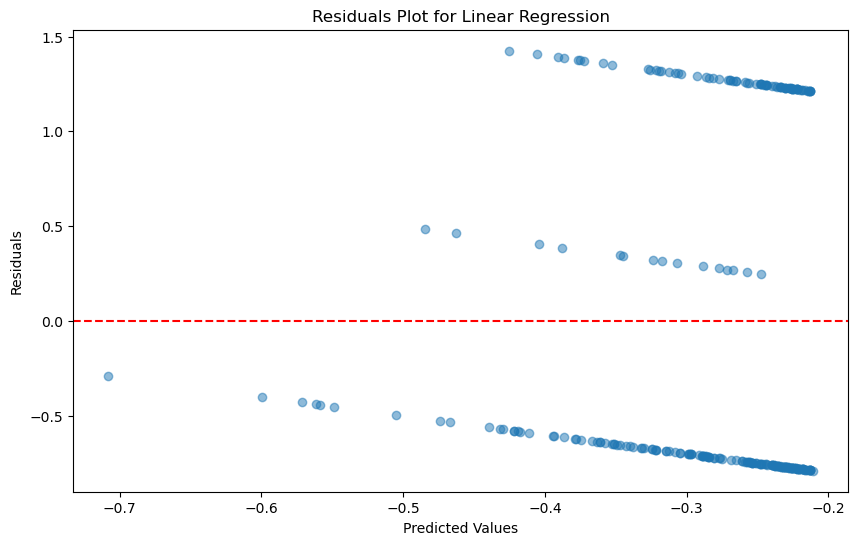

In [61]:
# Plot residuals for the best-performing model 
best_model_name = min(results, key=results.get) 
best_model = models[best_model_name] 
# Predict and calculate residuals 
y_pred = best_model.predict(X_test) 
residuals = y_test - y_pred 
plt.figure(figsize=(10, 6)) 
plt.scatter(y_pred, residuals, alpha=0.5) 
plt.axhline(y=0, color='r', linestyle='--') 
plt.xlabel('Predicted Values') 
plt.ylabel('Residuals') 
plt.title(f'Residuals Plot for {best_model_name}') 
plt.show() 

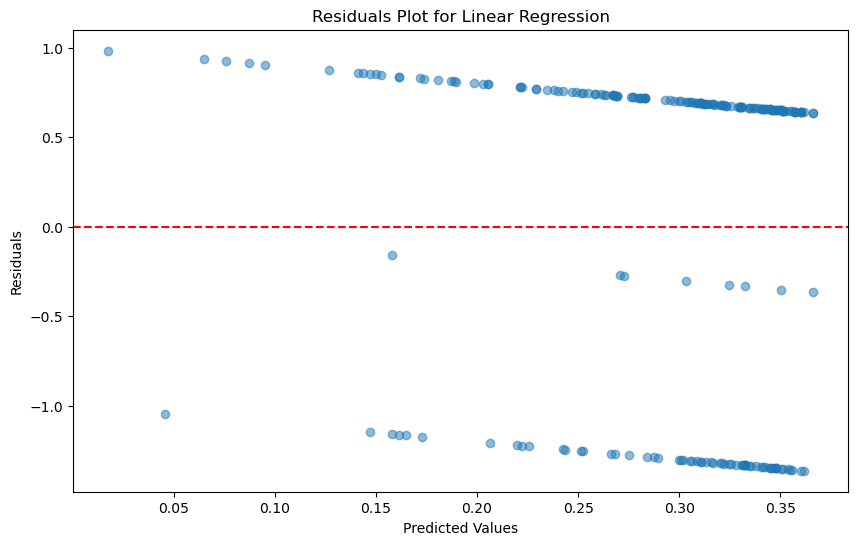

In [62]:
# Plot residuals for the best-performing model 
best_model_name2 = min(results2, key=results2.get) 
best_model2 = models2[best_model_name2] 
# Predict and calculate residuals 
y_pred2 = best_model2.predict(X_test2) 
residuals2 = y_test2 - y_pred2 
plt.figure(figsize=(10, 6)) 
plt.scatter(y_pred2, residuals2, alpha=0.5) 
plt.axhline(y=0, color='r', linestyle='--') 
plt.xlabel('Predicted Values') 
plt.ylabel('Residuals') 
plt.title(f'Residuals Plot for {best_model_name2}') 
plt.show() 

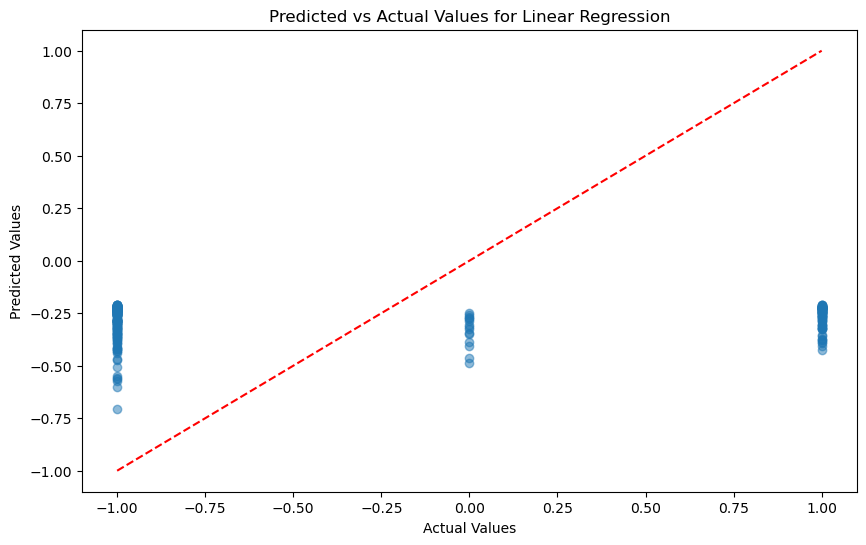

In [63]:
plt.figure(figsize=(10, 6)) 
plt.scatter(y_test, y_pred, alpha=0.5) 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--') 
plt.xlabel('Actual Values') 
plt.ylabel('Predicted Values') 
plt.title(f'Predicted vs Actual Values for {best_model_name}') 
plt.show()

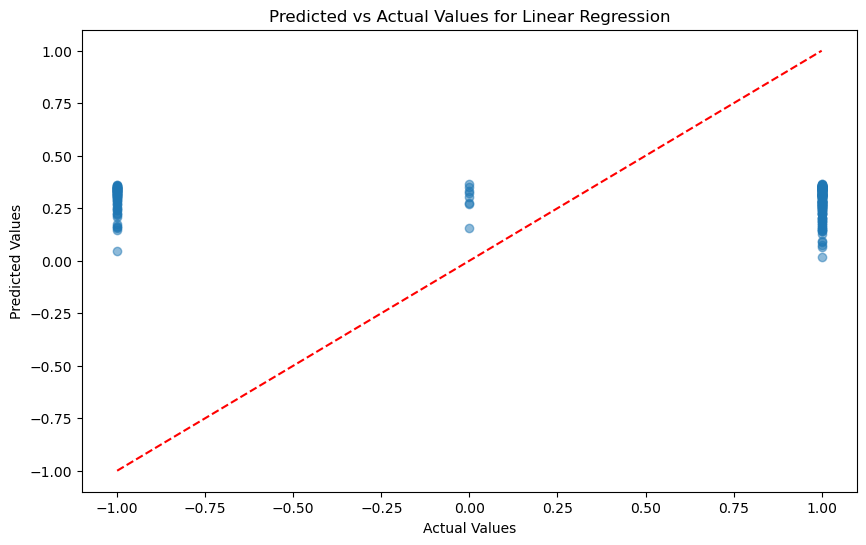

In [64]:
plt.figure(figsize=(10, 6)) 
plt.scatter(y_test2, y_pred2, alpha=0.5) 
plt.plot([min(y_test2), max(y_test2)], [min(y_test2), max(y_test2)], 'r--') 
plt.xlabel('Actual Values') 
plt.ylabel('Predicted Values') 
plt.title(f'Predicted vs Actual Values for {best_model_name2}') 
plt.show()

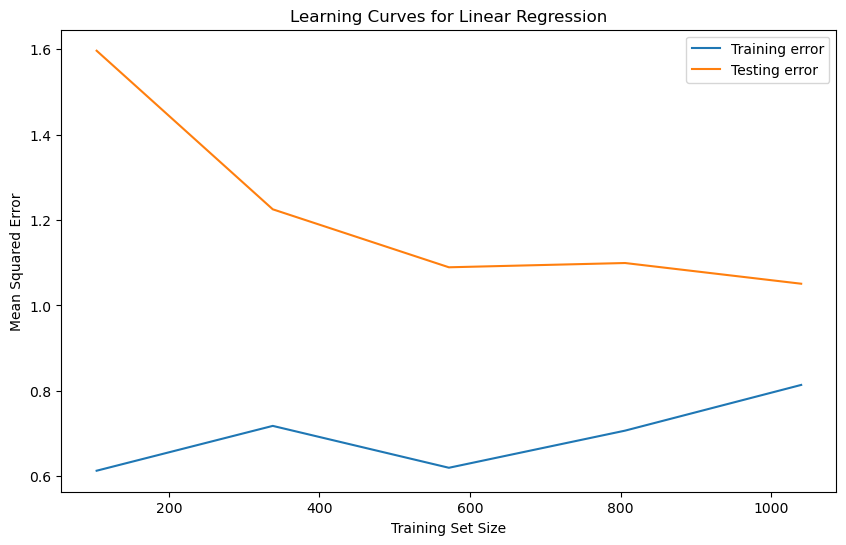

In [65]:
from sklearn.model_selection import learning_curve 
train_sizes, train_scores, test_scores = learning_curve(best_model, X, y, cv=5, scoring='neg_mean_squared_error') 
plt.figure(figsize=(10, 6)) 
plt.plot(train_sizes, -train_scores.mean(axis=1), label='Training error') 
plt.plot(train_sizes, -test_scores.mean(axis=1), label='Testing error')
plt.xlabel('Training Set Size') 
plt.ylabel('Mean Squared Error') 
plt.title(f'Learning Curves for {best_model_name}') 
plt.legend() 
plt.show() 

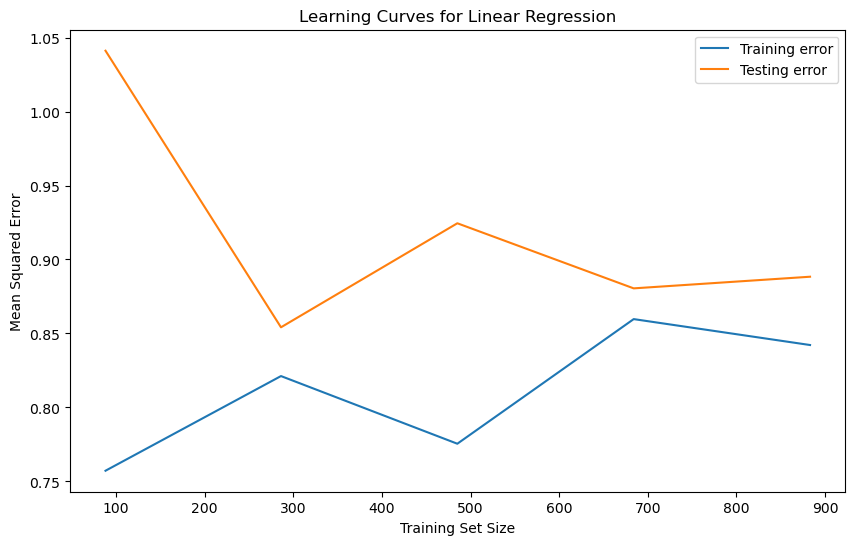

In [66]:
train_sizes2, train_scores2, test_scores2 = learning_curve(best_model2, X2, y2, cv=5, scoring='neg_mean_squared_error') 
plt.figure(figsize=(10, 6)) 
plt.plot(train_sizes2, -train_scores2.mean(axis=1), label='Training error') 
plt.plot(train_sizes2, -test_scores2.mean(axis=1), label='Testing error')
plt.xlabel('Training Set Size') 
plt.ylabel('Mean Squared Error') 
plt.title(f'Learning Curves for {best_model_name2}') 
plt.legend() 
plt.show() 

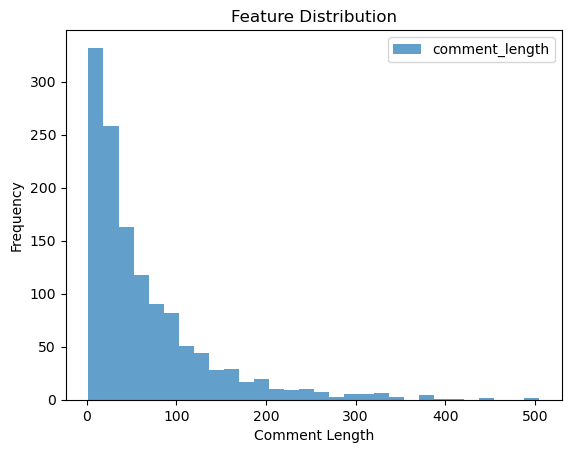

In [67]:
df1[['comment_length']].plot(kind='hist', bins=30, alpha=0.7) 
plt.xlabel('Comment Length') 
plt.title('Feature Distribution') 
plt.show() 

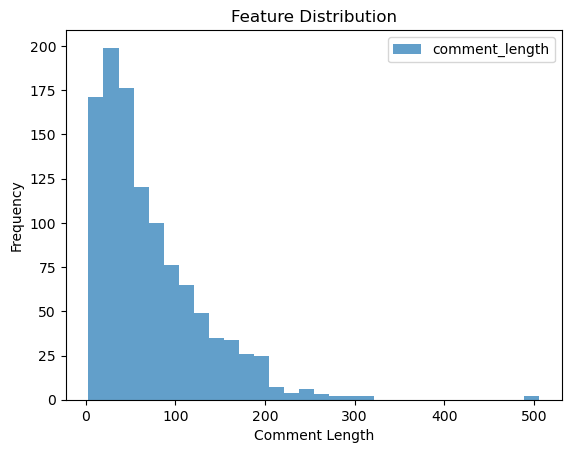

In [68]:
df2[['comment_length']].plot(kind='hist', bins=30, alpha=0.7) 
plt.xlabel('Comment Length') 
plt.title('Feature Distribution') 
plt.show() 

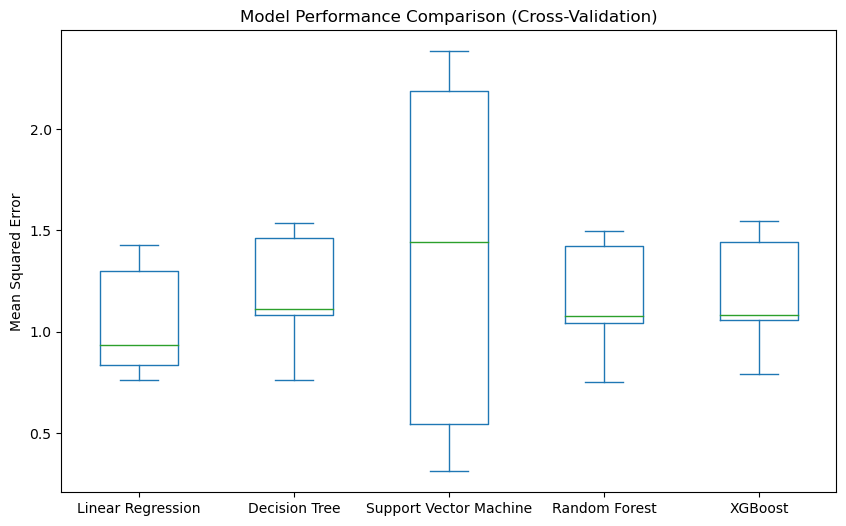

In [69]:
from sklearn.model_selection import cross_val_score 
cv_results = {} 
for name, model in models.items(): 
    scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error') 
    cv_results[name] = -scores 
cv_results_df = pd.DataFrame(cv_results) 
cv_results_df.plot.box(figsize=(10, 6)) 
plt.title('Model Performance Comparison (Cross-Validation)') 
plt.ylabel('Mean Squared Error') 
plt.show() 

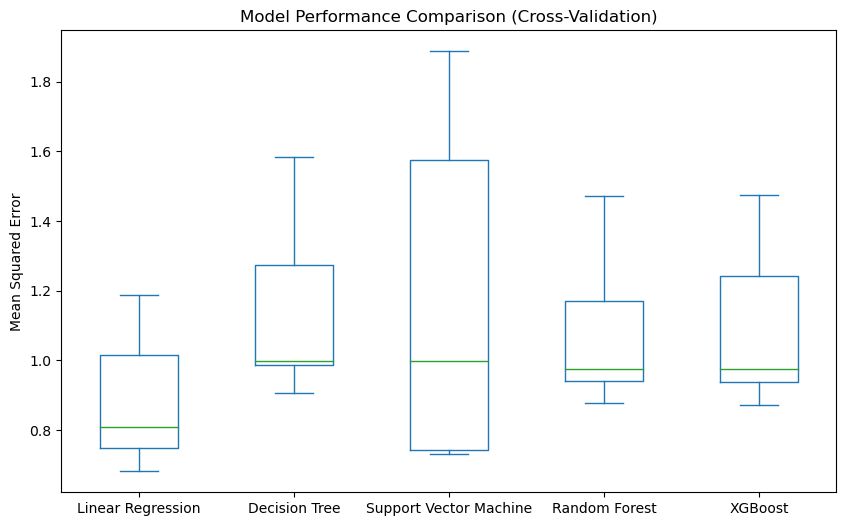

In [70]:
cv_results2 = {} 
for name2, model2 in models2.items(): 
    scores2 = cross_val_score(model2, X2, y2, cv=5, scoring='neg_mean_squared_error') 
    cv_results2[name2] = -scores2 

cv_results_df2 = pd.DataFrame(cv_results2) 
cv_results_df2.plot.box(figsize=(10, 6)) 
plt.title('Model Performance Comparison (Cross-Validation)') 
plt.ylabel('Mean Squared Error') 
plt.show()

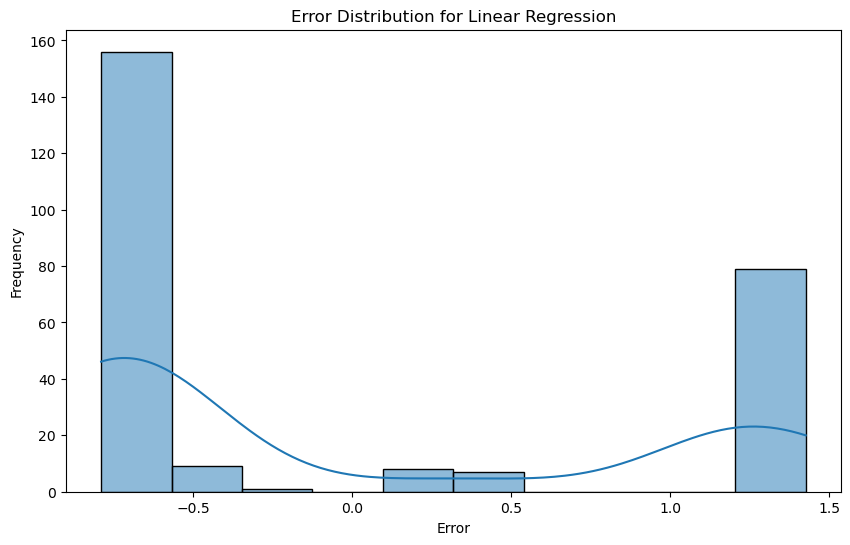

In [71]:
errors = y_test - y_pred 
plt.figure(figsize=(10, 6)) 
sns.histplot(errors, kde=True) 
plt.xlabel('Error') 
plt.ylabel('Frequency') 
plt.title(f'Error Distribution for {best_model_name}') 
plt.show() 

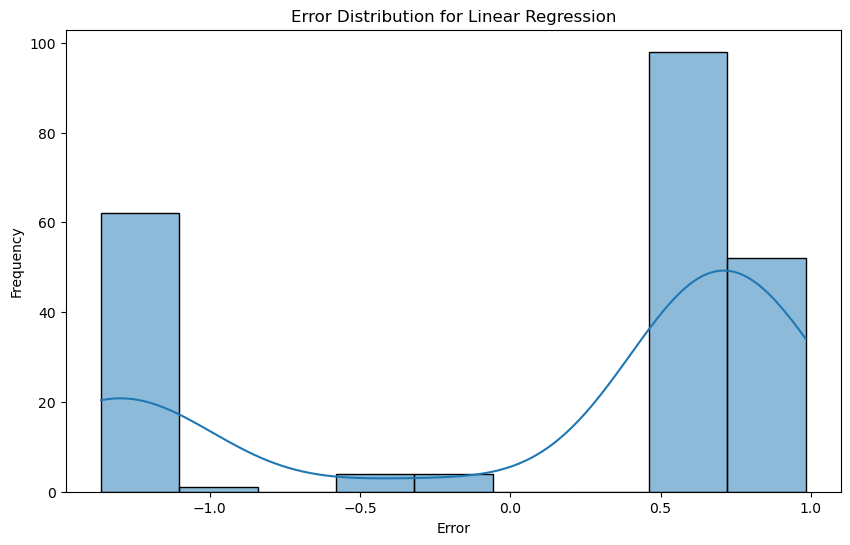

In [72]:
errors2 = y_test2 - y_pred2 
plt.figure(figsize=(10, 6)) 
sns.histplot(errors2, kde=True) 
plt.xlabel('Error') 
plt.ylabel('Frequency') 
plt.title(f'Error Distribution for {best_model_name2}') 
plt.show()

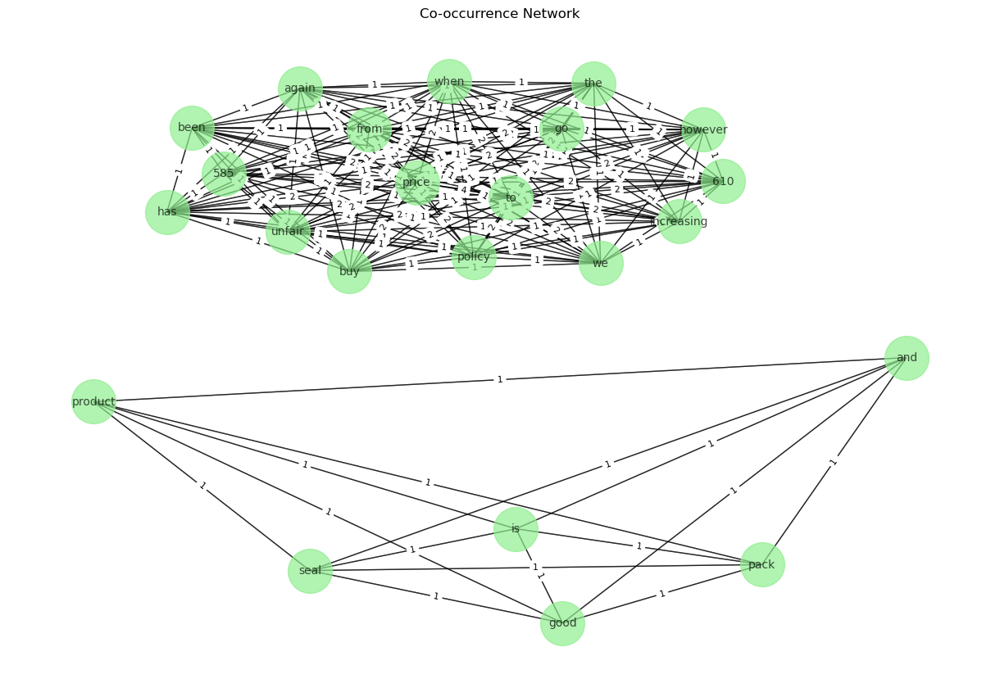

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx  # Importing networkx with the alias 'nx'

# Example comments
comments = df1['Comment'].head(2).tolist()

# Create a count matrix
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(comments)
terms = vectorizer.get_feature_names_out()

# Create a co-occurrence matrix
co_occurrence = (X.T @ X).toarray()
np.fill_diagonal(co_occurrence, 0)

# Build the network
G = nx.Graph()  # Use nx.Graph() to create the graph
for i in range(len(terms)):
    G.add_node(terms[i])
for i in range(len(terms)):
    for j in range(i + 1, len(terms)):
        if co_occurrence[i, j] > 0:
            G.add_edge(terms[i], terms[j], weight=co_occurrence[i, j])

# Draw the network
plt.figure(figsize=(12, 8))  # Increase the figure size
pos = nx.spring_layout(G, k=0.5, iterations=20)  # Adjust layout parameters
nx.draw(G, pos, with_labels=True, node_size=1500, node_color='lightgreen', font_size=10, alpha=0.7)
edge_labels = nx.get_edge_attributes(G, 'weight')

# Draw edges with transparency
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, font_color='black')

plt.title('Co-occurrence Network')
plt.axis('off')  # Turn off the axis
plt.show()


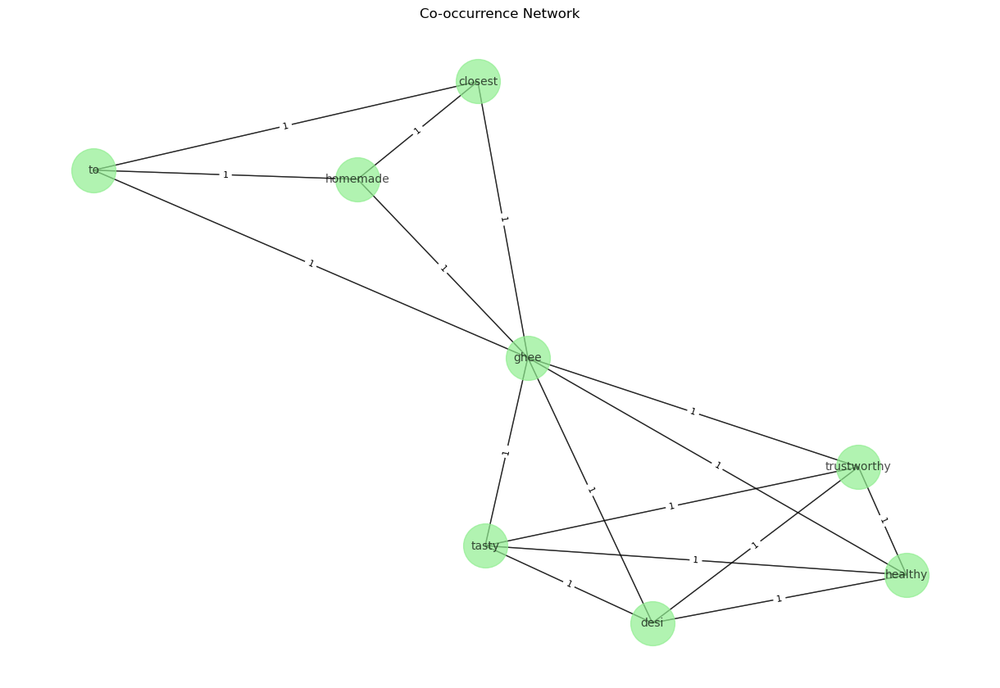

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import networkx as nx  # Importing networkx with the alias 'nx'

# Example comments
comments = df2['Comment'].head(2).tolist()

# Create a count matrix
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(comments)
terms = vectorizer.get_feature_names_out()

# Create a co-occurrence matrix
co_occurrence = (X.T @ X).toarray()
np.fill_diagonal(co_occurrence, 0)

# Build the network
G = nx.Graph()  # Use nx.Graph() to create the graph
for i in range(len(terms)):
    G.add_node(terms[i])
for i in range(len(terms)):
    for j in range(i + 1, len(terms)):
        if co_occurrence[i, j] > 0:
            G.add_edge(terms[i], terms[j], weight=co_occurrence[i, j])

# Draw the network
plt.figure(figsize=(12, 8))  # Increase the figure size
pos = nx.spring_layout(G, k=0.5, iterations=20)  # Adjust layout parameters
nx.draw(G, pos, with_labels=True, node_size=1500, node_color='lightgreen', font_size=10, alpha=0.7)
edge_labels = nx.get_edge_attributes(G, 'weight')

# Draw edges with transparency
nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, font_color='black')

plt.title('Co-occurrence Network')
plt.axis('off')  # Turn off the axis
plt.show()
